**Содержание**:
* [Создание датасета](#dataset)
    * [Сбор данных](#data-collection)
    * [Подготовка для обучения модели](#data-preparation)
    * [Обучение модели](#model-training)
    * [Разметка с помощью предобученной модели](#data-labeling)
* [Задача классификации](#classification)
    * [Мультиклассовая классификация](#multi-classification)
        * [Локализация классов](#classes-localization)
        * [Описательный анализ](#descriptive-analysis)
        * [Классические модели](#classic-models)
        * [Оптимизации классических моделей](#models-optimization)
        * [Ансамблирование моделей](#ensemble-models)
        * [Уменьшение размерности](#dimension-reduction)
            * [Метод главных компонент (PCA)](#pca)
            * [Линейный дискриминантный анализ (LDA)](#lda)
            * [Гистограмма направленных градиентов (HOG)](#hog)
        * [Регуляризация](#regularization)
        * [Выбор лучшей модели](#best-model)
    * [Бинарная классификация](#bin-classification)
        * [Расширение мультиклассовой задачи](#extension-multi)
        * [Постановка задачи бинарной классификации](#bin-task)
* [Задача локализации](#localization)
    * [Скользящее окно](#sliding-window)
    * [Non-maximum suppression (NMS)](#nms)
* [Собираем все вместе](#result)
* [Нейросети. Глубокое обучение](#neural-networks)
    * [R-CNN](#r-cnn)
    * [YOLO](#yolo)

In [1]:
import shutil
from collections import defaultdict
from functools import reduce
from pathlib import Path
from typing import Callable, List, Tuple, Dict

import cv2
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from matplotlib.axes import Axes
from matplotlib.figure import Figure
from mpl_toolkits.axes_grid1 import ImageGrid
from tqdm.notebook import tqdm

import utils

In [2]:
# @formatter:off
%matplotlib inline
%load_ext autoreload
%autoreload 2
# @formatter:on

In [3]:
plt.style.use('science')
sns.set_theme()
plt.rcParams['figure.dpi'] = 100
plt.rcParams['savefig.dpi'] = 300

In [4]:
# ---- Path

DATA_DIR = Path('data')
DATA_VIDEOS = DATA_DIR / 'videos'
DATA_IMAGES = DATA_DIR / 'images'
DATA_LABELS = DATA_DIR / 'labels'
DATA_CROP = DATA_DIR / 'crop'
DATA_OTHER = DATA_DIR / 'other'
DATA_PROBLEMS = DATA_OTHER / 'problems.txt'

DIST_DIR = Path('dist')
DIST_LABELS = DIST_DIR / 'labels'
DIST_LABELS_HAND = DIST_LABELS / 'hand'
DIST_LABELS_YOLO = DIST_LABELS / 'yolo'
DIST_MODELS = DIST_DIR / 'models'
DIST_PLOTS = DIST_DIR / 'plots'

# ---- Image

IMG_SIZE_ORIG = 720
IMG_SIZE_YOLO = 416

DATA_IMAGES_ORIG = DATA_IMAGES / str(IMG_SIZE_ORIG)
DATA_IMAGES_YOLO = DATA_IMAGES / str(IMG_SIZE_YOLO)

# ---- Domain

MOBS = ['zombie', 'skeleton', 'spider', 'creeper', 'enderman', 'slime']
BIOMES = [
    'plains_0', 'plains_1',
    'savanna_0', 'savanna_1',
    'desert_0', 'desert_1',
    'snowy_0', 'snowy_1',
    'cave',
]

# ---- Utils

RANDOM = np.random.default_rng(0)
COLOR_PALETTE = utils.ColorPalette([
    (8, 247, 254),
    (254, 83, 187),
    (238, 66, 102),
    (255, 210, 63),
    (59, 206, 172),
    (14, 173, 105),
], MOBS)

FIG_WIDTH_S = 6
FIG_WIDTH_M = 8
FIG_WIDTH_L = 10
FIG_WIDTH_XL = 12
FIG_WIDTH_XXL = 14

# ---- Mosaic

MOSAIC_3 = utils.Mosaic("""
    AAB
    AAC
""")

MOSAIC_15 = utils.Mosaic("""
    ABEEFF
    CDEEFF
    GGGGHH
    GGGGHH
    GGGGKL
    GGGGMN
    OOPPQQ
    OOPPQQ
""")

MOSAIC_27 = utils.Mosaic("""
    AABBCDEFGH
    AABBIIIIII
    JJJJIIIIII
    JJJJIIIIII
    JJJJIIIIII
    JJJJIIIIII
    KKLMIIIIII
    KKNOPPPQQR
    XYWWPPPQQS
    Z0WWPPPTUV
""")

# Создание датасета <a name="dataset"></a>

## Сбор данных <a name="data-collection"></a>

In [11]:
def video2frames(path: Path, save_dir: Path, name: str):
    vidcap = cv2.VideoCapture(str(path))
    ok, img = vidcap.read()
    cnt = 0
    while ok:
        cv2.imwrite(str(save_dir / f'{name}_{cnt:02}.jpg'), img[:, 75:img.shape[0] + 75])
        cnt += 1
        vidcap.set(cv2.CAP_PROP_POS_MSEC, (cnt * 500))
        ok, img = vidcap.read()


def create_images_from_videos(video_path: Path, image_path: Path):
    """Создает картинки для всех групп мобов из соответствующих видео"""
    for i, mob in enumerate(tqdm(MOBS)):
        mob_ = f'{i:02}_{mob}'
        for j, biome in enumerate(tqdm(BIOMES)):
            biome_ = f'{j:02}_{biome}'
            video2frames(video_path / mob_ / f'{biome_}.mkv', image_path, f'{mob_}_{biome_}')


In [21]:
create_images_from_videos(DATA_VIDEOS, DATA_IMAGES_ORIG)

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

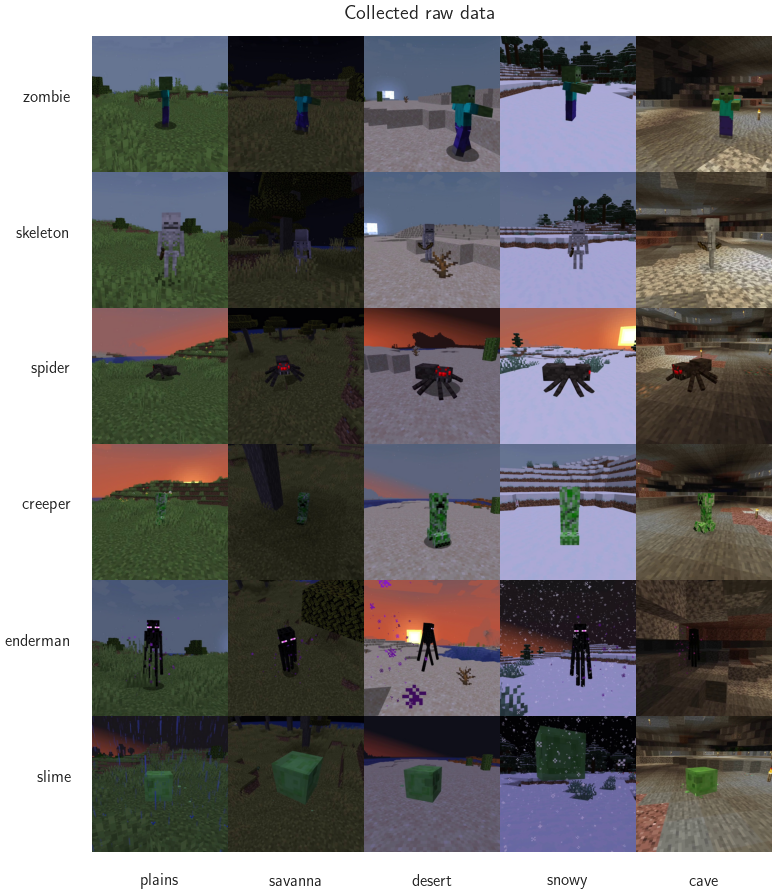

In [68]:
biomes_sample = [
    '00_plains_0_01.jpg',
    '03_savanna_1_25.jpg',
    '04_desert_0_12.jpg',
    '06_snowy_0_01.jpg',
    '08_cave_08.jpg'
]
biomes_sample_names = [i.split('_')[1] for i in biomes_sample]
images_sample = []
for i, mob in enumerate(MOBS):
    mob_ = f'{i:02}_{mob}'
    for biome in biomes_sample:
        path = DATA_IMAGES_ORIG / f'{mob_}_{biome}'
        images_sample.append(utils.Image.open(path).data)

nrows, ncols = 6, 5
fig: Figure = plt.figure(figsize=(utils.rectsize(9, nrows, ncols)))
fig.suptitle('Collected raw data', y=0.91)

grid = ImageGrid(fig, 111, nrows_ncols=(nrows, ncols), axes_pad=0)
for i, (ax, img) in enumerate(zip(grid, images_sample)):
    utils.reset_axes(ax)

    row = i // ncols
    col = i % ncols
    if col == 0:
        ax.set_ylabel(MOBS[row], rotation=0, labelpad=8, horizontalalignment='right', size=12)
    if row == nrows - 1:
        ax.set_xlabel(biomes_sample_names[col], labelpad=8, size=12)

    ax.imshow(img)

utils.savefig(DIST_PLOTS / 'mobs_biomes.png', fig)
del images_sample

## Подготовка для обучения модели <a name="data-preparation"></a>

In [62]:
def resize_images(orig_dir: Path, resize_dir: Path, size: int):
    for img_path in tqdm(list(orig_dir.iterdir())):
        img = utils.Image.open(img_path)
        img.data = cv2.resize(img.data, (size, size))
        img.save(resize_dir / img_path.name)


def sample_for_labeling(images_dir: Path, labels_dir: Path, use_fixed: bool = False):
    """Выбирает случайный набор изображений для создания ручной разметки"""

    target_dir = labels_dir / 'images'
    shutil.rmtree(target_dir, ignore_errors=True)
    target_dir.mkdir()

    if use_fixed:
        fixed_dir = labels_dir / '.fixed'
        for f in (fixed_dir / 'images').iterdir():
            shutil.copy(f, target_dir)

        _labels = labels_dir / 'labels'
        shutil.rmtree(_labels, ignore_errors=True)
        _labels.mkdir()
        for f in (fixed_dir / 'labels').iterdir():
            shutil.copy(f, _labels)

    else:
        images = defaultdict(list)
        for f in images_dir.iterdir():
            mob = f.name.split('_')[1]
            images[mob].append(f)

        for files in images.values():
            for f in np.sort(RANDOM.choice(files, size=40, replace=False)):
                shutil.copy(f, target_dir)


def create_dataset_for_yolo(labels_dir: Path, dataset_dir: Path):
    """Создает датасет из размеченных данных для обучения YOLOv5"""

    def train_augment(
            img: np.ndarray,
            cls: int,
            bbox: utils.BBox
    ) -> List[Tuple[np.ndarray, int, utils.BBox, str]]:
        orig = (img, cls, bbox)
        orig_pos_rotated = utils.transform(utils.a_rotate(10), *orig)
        orig_neg_rotated = utils.transform(utils.a_rotate(-10), *orig)
        orig_pos_pos_shear = utils.transform(utils.a_shear(12, 12), *orig)
        orig_neg_pos_shear = utils.transform(utils.a_shear(-12, 12), *orig)
        orig_pos_neg_shear = utils.transform(utils.a_shear(12, -12), *orig)
        orig_neg_neg_shear = utils.transform(utils.a_shear(-12, -12), *orig)

        flipped = utils.transform(utils.a_horizontal_flip(), *orig)
        flipped_pos_rotated = utils.transform(utils.a_rotate(10), *flipped)
        flipped_neg_rotated = utils.transform(utils.a_rotate(-10), *flipped)
        flipped_pos_pos_shear = utils.transform(utils.a_shear(12, 12), *flipped)
        flipped_neg_pos_shear = utils.transform(utils.a_shear(-12, 12), *flipped)
        flipped_pos_neg_shear = utils.transform(utils.a_shear(12, -12), *flipped)
        flipped_neg_neg_shear = utils.transform(utils.a_shear(-12, -12), *flipped)

        return [
            (*orig, ''),
            (*orig_pos_rotated, 'pos_rotated'),
            (*orig_neg_rotated, 'neg_rotated'),
            (*orig_pos_pos_shear, 'pos_pos_shear'),
            (*orig_neg_pos_shear, 'neg_pos_shear'),
            (*orig_pos_neg_shear, 'pos_neg_shear'),
            (*orig_neg_neg_shear, 'neg_neg_shear'),

            (*flipped, 'flip'),
            (*flipped_pos_rotated, 'flip_pos_rotated'),
            (*flipped_neg_rotated, 'flip_neg_rotated'),
            (*flipped_pos_pos_shear, 'pos_pos_shear'),
            (*flipped_neg_pos_shear, 'neg_pos_shear'),
            (*flipped_pos_neg_shear, 'pos_neg_shear'),
            (*flipped_neg_neg_shear, 'neg_neg_shear'),
        ]

    def test_augment(
            img: np.ndarray,
            cls: int,
            bbox: utils.BBox
    ) -> List[Tuple[np.ndarray, int, utils.BBox, str]]:
        orig = (img, cls, bbox)
        flipped = utils.transform(utils.a_horizontal_flip(), *orig)
        return [(*orig, ''), (*flipped, 'flip')]  # type: ignore

    def save_augment(
            augment: Callable[[np.ndarray, int, utils.BBox], List[Tuple[np.ndarray, int, utils.BBox, str]]],
            images: List[Path],
            labels: List[Path],
            name: str
    ):
        images_dir = dataset_dir / name / 'images'
        images_dir.mkdir(exist_ok=True, parents=True)
        labels_dir = dataset_dir / name / 'labels'
        labels_dir.mkdir(exist_ok=True, parents=True)
        for img_path, label_path in zip(images, labels):
            img = utils.Image.open(img_path)
            label = utils.Label.open(label_path)
            augments = augment(img.data, label.cls, label.bbox)
            for data, cls, bbox, name in augments:
                utils.Image(data).save(images_dir / f'{"_".join([img_path.stem, name])}.jpg')
                utils.Label(cls, bbox).save(labels_dir / f'{"_".join([label_path.stem, name])}.txt')

    by_mobs = defaultdict(list)
    for img, label in zip((labels_dir / 'images').iterdir(), (labels_dir / 'labels').iterdir()):
        mob = img.name.split('_')[1]
        by_mobs[mob].append((img, label))

    for mob, images_labels in tqdm(by_mobs.items()):
        images, labels = zip(*images_labels)
        images_train, images_valid, images_test, labels_train, labels_valid, labels_test = utils.train_valid_test_split(
            images,
            labels,
            train_size=0.8,
            valid_size=0.1,
            random_state=0,
        )

        save_augment(train_augment, images_train, labels_train, 'train')
        save_augment(test_augment, images_valid, labels_valid, 'valid')
        save_augment(test_augment, images_test, labels_test, 'test')

    colab_root = Path('/content')
    train_data_path = str((colab_root / dataset_dir / 'train/images').as_posix())
    valid_data_path = str((colab_root / dataset_dir / 'valid/images').as_posix())
    test_data_path = str((colab_root / dataset_dir / 'test/images').as_posix())

    data = {
        'names': MOBS,
        'nc': len(MOBS),
        'train': train_data_path,
        'val': valid_data_path,
        'test': test_data_path,
    }
    utils.write_yaml(dataset_dir / 'data.yaml', data)

    only_train_path = [train_data_path, valid_data_path, test_data_path]
    only_train_data = {
        'names': MOBS,
        'nc': len(MOBS),
        'train': only_train_path,
        'val': only_train_path,
    }
    utils.write_yaml(dataset_dir / 'only_train_data.yaml', only_train_data)


In [38]:
resize_images(DATA_IMAGES_ORIG, DATA_IMAGES_YOLO, size=IMG_SIZE_YOLO)

  0%|          | 0/3787 [00:00<?, ?it/s]

In [64]:
sample_for_labeling(DATA_IMAGES_YOLO, DIST_LABELS_HAND, use_fixed=True)

In [65]:
# @formatter:off
%%capture

!.\venv39\Scripts\activate
!labelImg dist\labels\hand\images dist\labels\hand\labels\classes.txt dist\labels\hand\labels
!.\venv38\Scripts\activate
# @formatter:on

In [66]:
create_dataset_for_yolo(DIST_LABELS_HAND, DIST_LABELS_YOLO)

  0%|          | 0/6 [00:00<?, ?it/s]

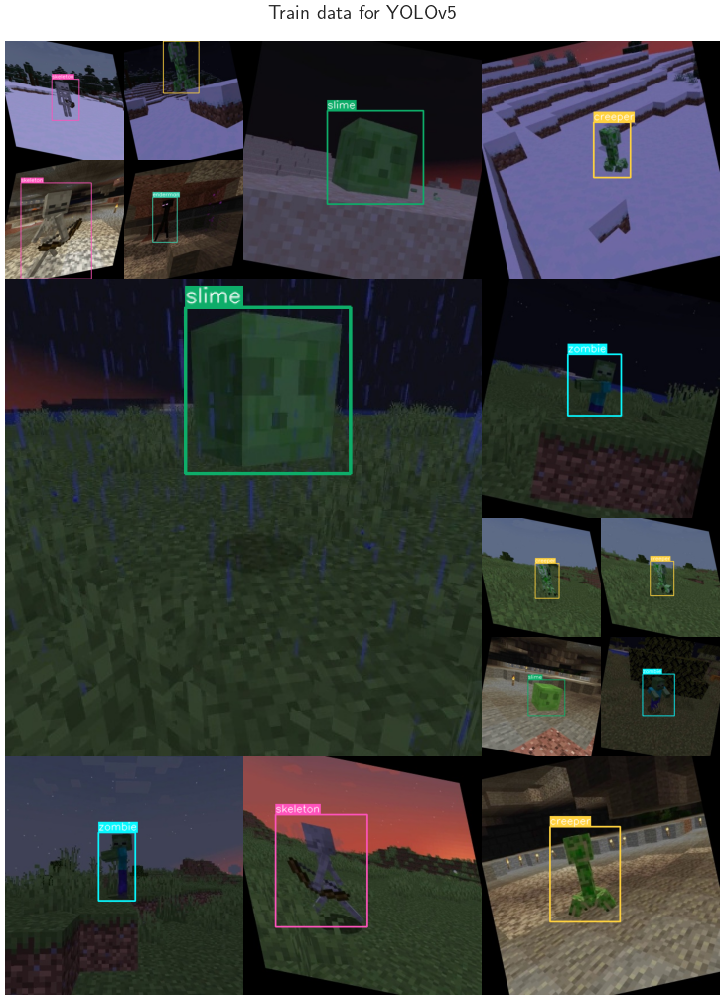

In [84]:
yolo_images_sample = sorted((DIST_LABELS_YOLO / 'train' / 'images').iterdir())
yolo_labels_sample = sorted((DIST_LABELS_YOLO / 'train' / 'labels').iterdir())
yolo_mobs_sample = [f.name.split('_')[1] for f in yolo_images_sample]

yolo_sample = RANDOM.choice(
    list(zip(yolo_images_sample, yolo_labels_sample, yolo_mobs_sample)),
    size=MOSAIC_15.nimages,
    replace=False
)

yolo_sample_plot = []
for i, (img_path, label_path, mob) in enumerate(yolo_sample):
    img = utils.Image.open(img_path)
    label = utils.Label.open(label_path)
    yolo_sample_plot.append(utils.visualize_bbox(img.data, label.bbox, mob, color=COLOR_PALETTE.get(mob)))

fig = MOSAIC_15.plot(yolo_sample_plot, fig_width=9, title='Train data for YOLOv5', title_kw={'y': 0.93})

utils.savefig(DIST_PLOTS / 'yolo_train_data_mosaic.png', fig)
del yolo_sample_plot

## Обучение модели <a name="model-training"></a>

In [12]:
# 01_colab.ipynb - код для запуска в colab

## Разметка с помощью предобученной модели <a name="data-labeling"></a>

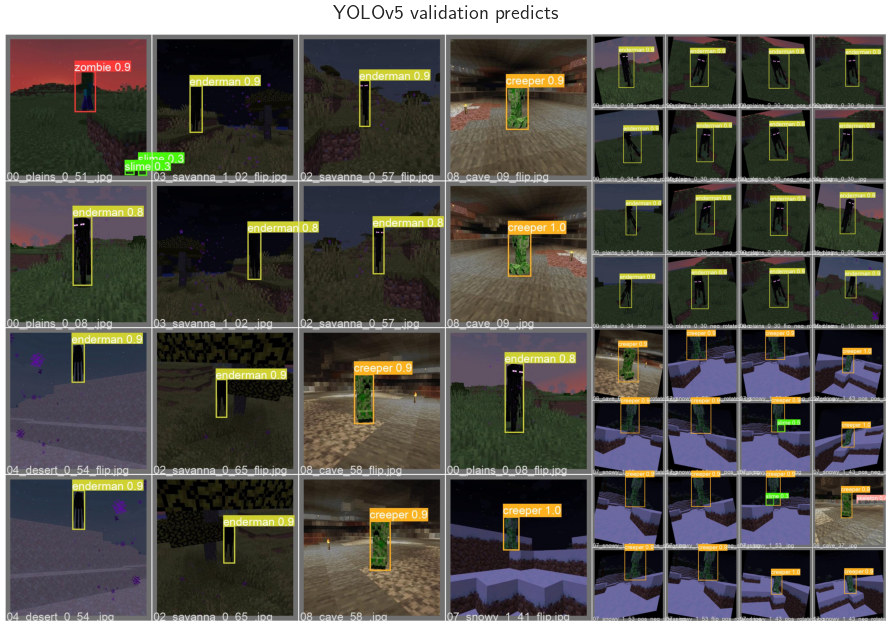

In [90]:
predict_batches = list((DIST_MODELS / 'yolov5/labeler/runs/train/exp').glob('val_batch?_pred.jpg'))
predict_plot = [utils.Image.open(i).data for i in predict_batches]

fig = MOSAIC_3.plot(predict_plot, fig_width=11, title='YOLOv5 validation predicts', title_kw={'y': 0.94})

utils.savefig(DIST_PLOTS / 'yolo_val_predicts_mosaic.png', fig)
del predict_plot

In [13]:
import yolov5
from yolov5.models.common import Detections, AutoShape

In [14]:
def yolo_labeling(yolo: AutoShape, images_dir: Path, labels_dir: Path) -> List[str]:
    problems = []

    batch = 200
    images = list(images_dir.iterdir())
    for i in tqdm(range(0, len(images) + 1, batch)):
        detects: Detections = yolo(images[i:i + batch], size=IMG_SIZE_YOLO)
        for detection, fname in zip(detects.xywhn, detects.files):
            mob_idx = MOBS.index(fname.split('_')[1])
            detection = detection[detection[:, -1] == mob_idx]
            if len(detection):
                detection = detection[detection[:, -2].argsort(descending=True)]
                *bbox, _, cls = detection[0]
                label = utils.Label(int(cls), utils.BBox(*map(float, bbox)))
                label.save(labels_dir / Path(fname).with_suffix('.txt'))
            else:
                problems.append(fname)
                with open(labels_dir / Path(fname).with_suffix('.txt'), 'w'):
                    pass

    with open(labels_dir / 'classes.txt', 'w') as f:
        f.write('\n'.join(MOBS))

    return problems


In [15]:
yolo = yolov5.load(DIST_MODELS / 'yolov5/labeler/runs/train/exp/weights/best.pt')

In [16]:
problems = yolo_labeling(yolo, DATA_IMAGES_YOLO, DATA_LABELS)
utils.write_problems(DATA_PROBLEMS, problems)
problems

  0%|          | 0/19 [00:00<?, ?it/s]

['00_zombie_03_savanna_1_12.jpg',
 '02_spider_01_plains_1_00.jpg',
 '02_spider_01_plains_1_04.jpg',
 '02_spider_01_plains_1_05.jpg',
 '02_spider_01_plains_1_53.jpg',
 '02_spider_01_plains_1_63.jpg',
 '02_spider_02_savanna_0_44.jpg',
 '02_spider_02_savanna_0_69.jpg',
 '02_spider_02_savanna_0_70.jpg',
 '02_spider_06_snowy_0_28.jpg',
 '02_spider_07_snowy_1_63.jpg',
 '02_spider_07_snowy_1_64.jpg',
 '03_creeper_02_savanna_0_69.jpg',
 '04_enderman_02_savanna_0_68.jpg',
 '04_enderman_05_desert_1_18.jpg']

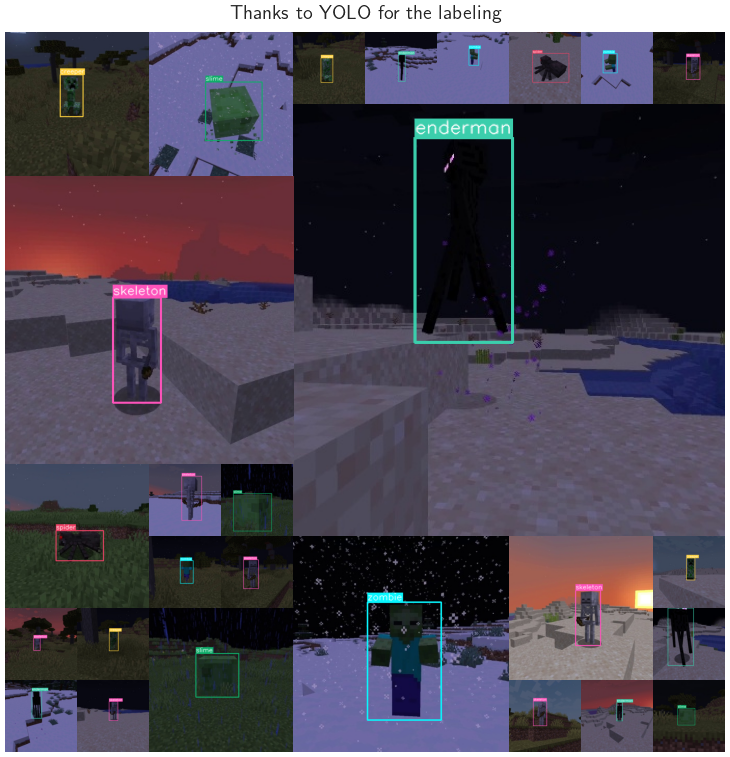

In [95]:
images_sample = sorted(DATA_IMAGES_YOLO.iterdir())
labels_sample = sorted(DATA_LABELS.iterdir())
mobs_sample = [f.name.split('_')[1] for f in images_sample]

sample = RANDOM.choice(
    list(zip(images_sample, labels_sample, mobs_sample)),
    size=MOSAIC_27.nimages,
    replace=False
)

sample_plot = []
for i, (img_path, label_path, mob) in enumerate(sample):
    img = utils.Image.open(img_path)
    label = utils.Label.open(label_path)
    sample_plot.append(utils.visualize_bbox(img.data, label.bbox, mob, color=COLOR_PALETTE.get(mob)))

fig = MOSAIC_27.plot(sample_plot, fig_width=9, title='Thanks to YOLO for the labeling', title_kw={'y': 0.93})

utils.savefig(DIST_PLOTS / 'yolo_labeling_mosaic.png', fig)
del sample_plot

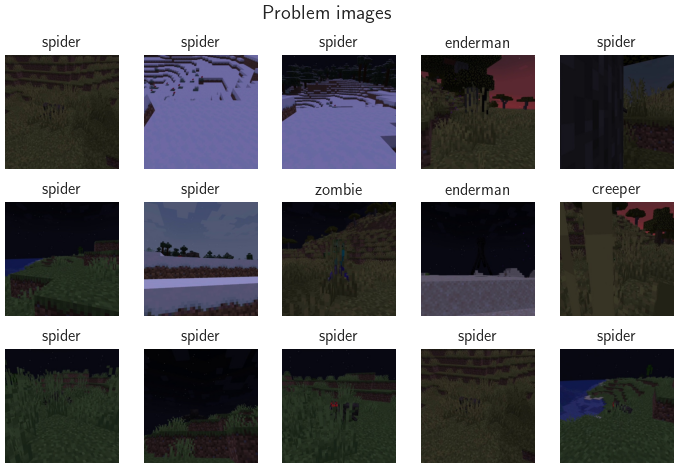

In [49]:
problem_images = [
    utils.Image.open(DATA_IMAGES_YOLO / p).data
    for p in problems
]

nrows, ncols = 3, 5
fig: Figure = plt.figure(figsize=(utils.rectsize(9, nrows, ncols)))
fig.suptitle('Problem images', y=0.975)

grid = ImageGrid(fig, 111, nrows_ncols=(nrows, ncols), axes_pad=(1 / 4, 1 / 3))
for i, (ax, img) in enumerate(zip(grid, problem_images)):
    utils.reset_axes(ax)
    ax.set_title(problems[i][:-4].split('_')[1])
    ax.imshow(img)

utils.savefig(DIST_PLOTS / 'yolo_problem_images.png', fig)
del problem_images

# Задача классификации <a name="classification"></a>

In [2]:
from sklearn.base import BaseEstimator, TransformerMixin
from skimage.feature import hog
from itertools import product
import pandas as pd
import timeit
import warnings
from sklearn.exceptions import ConvergenceWarning, UndefinedMetricWarning
from skimage.color import rgb2gray
from sklearn.decomposition import PCA
from sklearn.calibration import CalibratedClassifierCV
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn import metrics
from sklearn.pipeline import Pipeline
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode, iplot

init_notebook_mode()

In [6]:
from sklearn.svm import SVC, LinearSVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier, ExtraTreeClassifier
from sklearn.linear_model import (
    LogisticRegression,
    SGDClassifier,
    RidgeClassifier,
    PassiveAggressiveClassifier
)
from sklearn.ensemble import (
    RandomForestClassifier,
    ExtraTreesClassifier,
    AdaBoostClassifier,
    GradientBoostingClassifier
)

In [7]:
problems = set(utils.load_problems(DATA_PROBLEMS))
TIDY_IMAGE_NAMES = [f.stem for f in DATA_IMAGES_ORIG.iterdir() if f.name not in problems]
len(TIDY_IMAGE_NAMES)

3772

## Мультиклассовая классификация <a name="multi-classification"></a>

### Локализация классов <a name="classes-localization"></a>

In [8]:
min_max_bbox_labels = []
for name in TIDY_IMAGE_NAMES:
    label = utils.Label.open((DATA_LABELS / name).with_suffix('.txt'))
    *_, w, h = label.bbox.xywhn
    a = max(w, h)
    min_max_bbox_labels.append((a, label))

min_max_bbox_labels = sorted(min_max_bbox_labels, key=lambda x: x[0])

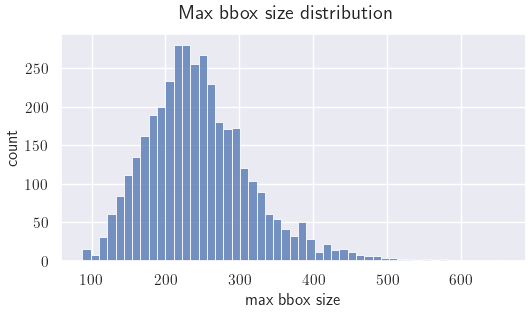

In [33]:
fig, ax = plt.subplots(figsize=(6, 3))
ax = sns.histplot(x=np.array([i[0] for i in min_max_bbox_labels]) * IMG_SIZE_ORIG, ax=ax)
fig.suptitle('Max bbox size distribution')
ax.set_xlabel('max bbox size')
ax.set_ylabel('count')

utils.savefig(DIST_PLOTS / 'max_bbox_size_distribution.png', fig)

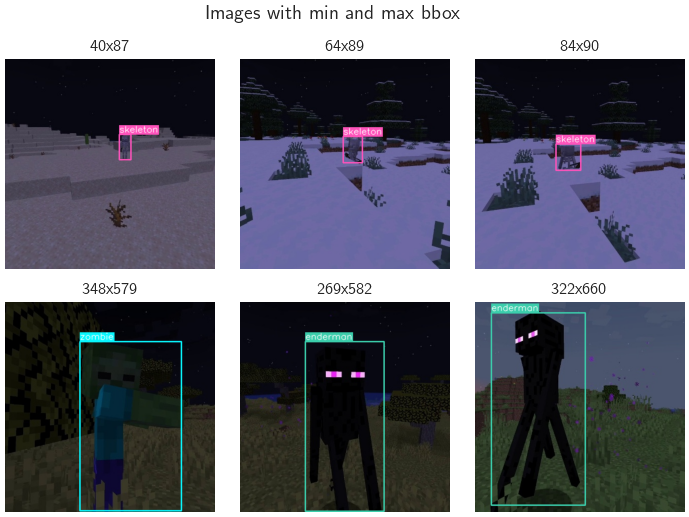

In [32]:
min_max_bbox_labels_sample = [*min_max_bbox_labels[:3], *min_max_bbox_labels[-3:]]

sample_plot = []
for _, label in min_max_bbox_labels_sample:
    name = label.path.name
    mob = name.split('_')[1]
    img = utils.Image.open((DATA_IMAGES_YOLO / name).with_suffix('.jpg'))

    *_, w, h = label.bbox.xywhn
    sample_plot.append((
        f'{int(w * IMG_SIZE_ORIG)}x{int(h * IMG_SIZE_ORIG)}',
        utils.visualize_bbox(img.data, label.bbox, mob, color=COLOR_PALETTE.get(mob)),
    ))

nrows, ncols = 2, 3
fig: Figure = plt.figure(figsize=(utils.rectsize(9, nrows, ncols)))
fig.suptitle('Images with min and max bbox', y=0.97)

grid = ImageGrid(fig, 111, nrows_ncols=(nrows, ncols), axes_pad=(1 / 4, 1 / 3))
for i, (ax, (title, img)) in enumerate(zip(grid, sample_plot)):
    utils.reset_axes(ax)
    ax.set_title(title)
    ax.imshow(img)

utils.savefig(DIST_PLOTS / 'min_max_bboxes.png', fig)
del sample_plot

In [8]:
TARGET_SIZE = 80

In [9]:
# https://blog.roboflow.com/you-might-be-resizing-your-images-incorrectly/#how-should-i-fill-padding-pixels
# https://forums.fast.ai/t/partial-convergence-padding-vs-reflection-zero-etc/43508

In [10]:
dataset = {'images': [], 'target': []}

for name in tqdm(TIDY_IMAGE_NAMES):
    img = utils.Image.open((DATA_IMAGES_ORIG / name).with_suffix('.jpg'))
    label = utils.Label.open((DATA_LABELS / name).with_suffix('.txt'))
    new_img = cv2.resize(utils.crop_bbox_rect(img.data, label.bbox, pad=2), (TARGET_SIZE, TARGET_SIZE))
    dataset['images'].append(new_img)
    dataset['target'].append(label.cls)

dataset['images'] = np.array(dataset['images'], dtype='uint8')
dataset['data'] = dataset['images'].reshape(dataset['images'].shape[0], -1)
dataset['target'] = np.array(dataset['target'], dtype='uint8')

  0%|          | 0/3772 [00:00<?, ?it/s]

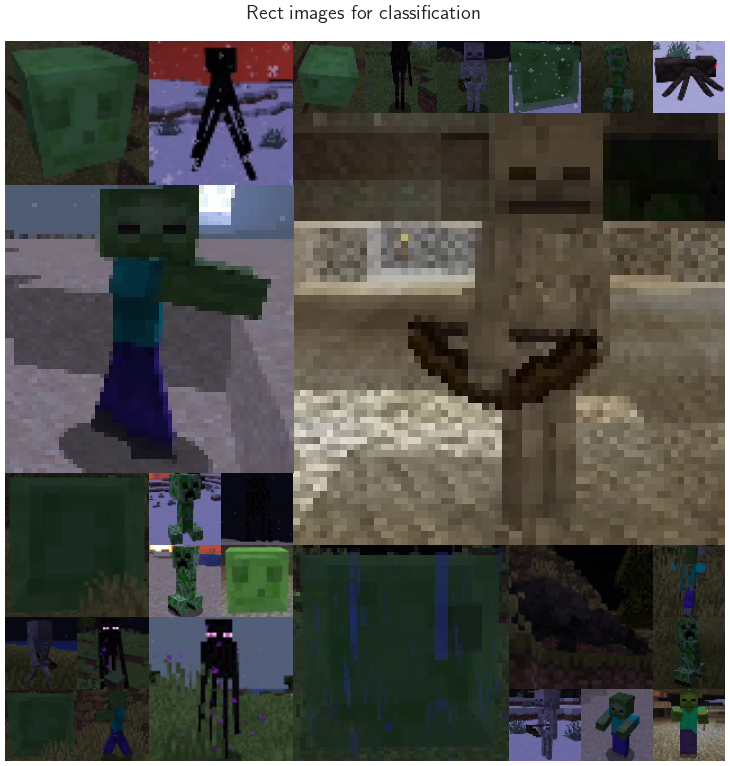

In [40]:
fig = MOSAIC_27.plot(
    RANDOM.choice(dataset['images'], size=MOSAIC_27.nimages, replace=False),
    fig_width=9,
    title='Rect images for classification',
    title_kw={'y': 0.94}
)

utils.savefig(DIST_PLOTS / 'rect_class_images_mosaic.png', fig)

### Описательный анализ <a name="descriptive-analysis"></a>

In [12]:
print(
    f'Classes: {len(np.unique(dataset["target"]))}\n'
    f'Samples total: {len(dataset["target"])}\n'
    f'Features: {dataset["data"].shape[1]} (int, {dataset["data"].min()}..{dataset["data"].max()})\n'
    f'Image size: {" x ".join(map(str, dataset["images"][0].shape))}'
)

Classes: 6
Samples total: 3772
Features: 19200 (int, 0..255)
Image size: 80 x 80 x 3


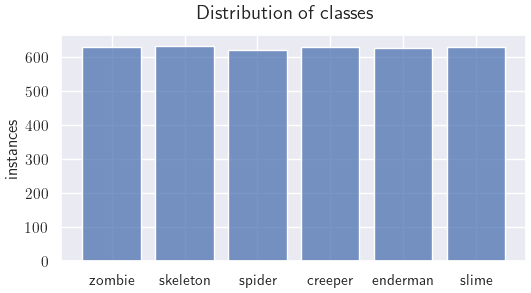

In [399]:
ax: Axes = sns.histplot(x=[MOBS[i] for i in dataset['target']], shrink=0.8, hue_order=MOBS)
ax.figure.set_size_inches(6, 3)
ax.set_ylabel('instances')
ax.figure.suptitle('Distribution of classes')

utils.savefig(DIST_PLOTS / 'distribution_of_classes.png', ax.figure)

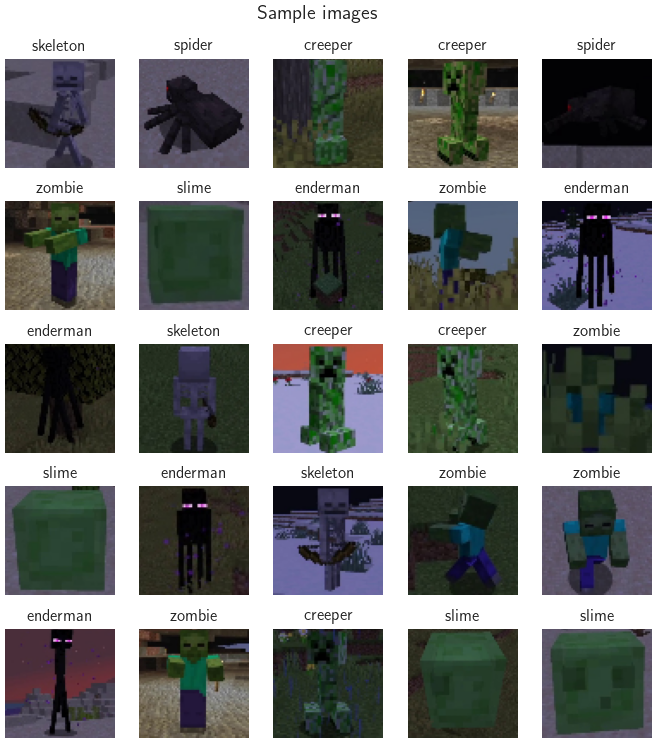

In [47]:
nrows, ncols = 5, 5
fig: Figure = plt.figure(figsize=(utils.rectsize(9, nrows, ncols)))
fig.suptitle('Sample images', y=0.94)

grid = ImageGrid(fig, 111, nrows_ncols=(nrows, ncols), axes_pad=(1 / 4, 1 / 3))
for i, (ax, j) in enumerate(zip(grid, RANDOM.integers(len(dataset['target']), size=nrows * ncols))):
    cls = dataset['target'][j]
    img = dataset['images'][j]

    utils.reset_axes(ax)
    ax.set_title(MOBS[cls])
    ax.imshow(img)

utils.savefig(DIST_PLOTS / 'classification_sample_images.png', fig)

### Классические модели <a name="classic-models"></a>

In [11]:
X = dataset['images']
y = dataset['target']
X_train, X_test, y_train, y_test = train_test_split(X, y, shuffle=True, test_size=0.2, stratify=y, random_state=0)

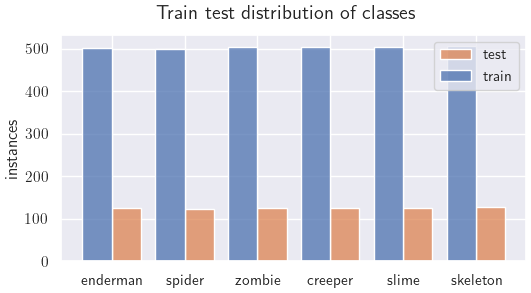

In [410]:
df_train = pd.DataFrame(y_train, columns=['cls'])
df_train['sample'] = 'train'
df_test = pd.DataFrame(y_test, columns=['cls'])
df_test['sample'] = 'test'
data = pd.concat([df_train, df_test], ignore_index=True)
data['cls'] = data['cls'].map(lambda x: MOBS[x])

ax: Axes = sns.histplot(data=data, x='cls', hue='sample', multiple='dodge', shrink=0.8)
ax.figure.set_size_inches(6, 3)
ax.figure.suptitle('Train test distribution of classes')
ax.set_xlabel('')
ax.set_ylabel('instances')
ax.legend(['test', 'train'], frameon=True)

utils.savefig(DIST_PLOTS / 'train_test_split_distribution.png', ax.figure)

In [12]:
class Flatter(BaseEstimator, TransformerMixin):

    def __init__(self):
        pass

    def fit(self, X, y=None):  # noqa
        return self

    def transform(self, X, y=None):  # noqa
        return X.reshape(X.shape[0], -1)


In [15]:
flatter = Flatter()
X_train_ = flatter.fit_transform(X_train)
X_test_ = flatter.transform(X_test)

clf = LogisticRegression(max_iter=500)

In [404]:
# @formatter:off

In [405]:
%%time

clf.fit(X_train_, y_train);

CPU times: total: 1min 27s
Wall time: 16.6 s


LogisticRegression(max_iter=500)

In [406]:
%%time

y_pred = clf.predict(X_test_)
# @formatter:on

CPU times: total: 31.2 ms
Wall time: 19.9 ms


In [407]:
print(metrics.classification_report(y_test, y_pred, digits=3, target_names=MOBS, zero_division=0))

              precision    recall  f1-score   support

      zombie      1.000     0.986     0.993       145
    skeleton      1.000     0.991     0.996       116
      spider      0.984     0.984     0.984       122
     creeper      1.000     0.983     0.992       119
    enderman      0.968     1.000     0.984       122
       slime      0.992     1.000     0.996       131

    accuracy                          0.991       755
   macro avg      0.991     0.991     0.991       755
weighted avg      0.991     0.991     0.991       755



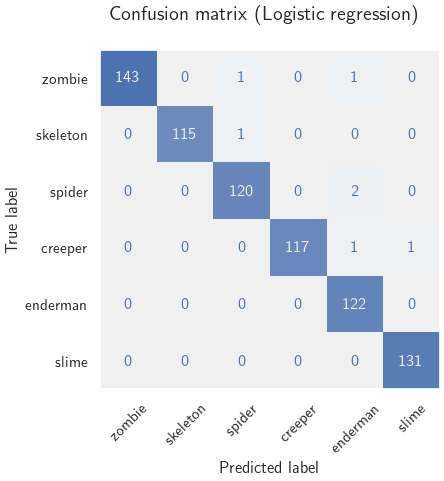

In [408]:
cm_display = metrics.ConfusionMatrixDisplay.from_predictions(
    y_test,
    y_pred,
    display_labels=MOBS,
    colorbar=False,
    xticks_rotation=45,
    cmap=sns.color_palette('light:b', as_cmap=True)
)
cm_display.ax_.grid(False)
cm_display.figure_.set_size_inches(4.5, 4.5)
cm_display.figure_.suptitle('Confusion matrix (Logistic regression)')

utils.savefig(DIST_PLOTS / 'logistic_regression_confusion_matrix.png', cm_display.figure_)

In [104]:
y_decision_f = MinMaxScaler().fit_transform(clf.decision_function(X_test_))

y_pred_proba = clf.predict_proba(X_test_)
df = pd.DataFrame(y_pred_proba)
worst_proba = df.iloc[df.max(axis=1).argsort()]

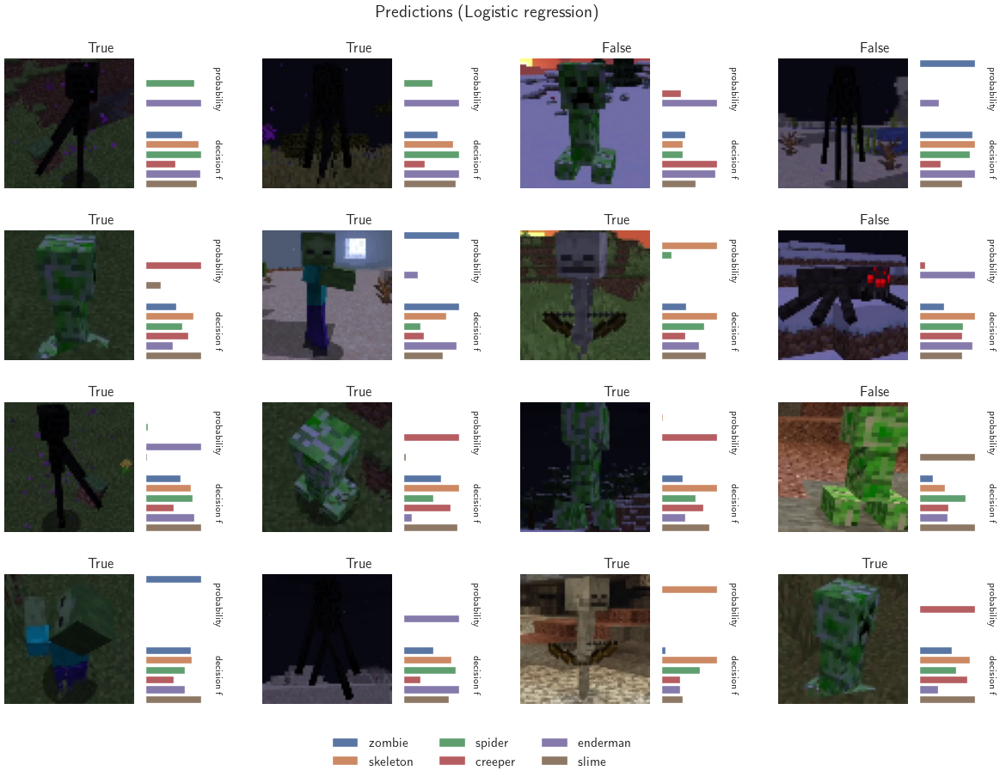

In [179]:
nrows, ncols = 4, 4
fig = utils.plot_probability_grid(
    nrows=nrows,
    ncols=ncols,
    idxs=worst_proba[:4 * 4].index,
    y_true=y_test,
    y_pred=y_pred,
    proba=y_pred_proba,
    decision_f=y_decision_f,
    images=X_test,
    labels=MOBS,
    figsize=(3 * nrows, 2 * ncols),
)
fig.suptitle('Predictions (Logistic regression)', y=1.05)

utils.savefig(DIST_PLOTS / 'logistic_regression_predict_probability.png', fig)

In [13]:
SCORING = ['accuracy', 'precision_weighted', 'recall_weighted', 'f1_weighted']
_KEYS = [
    'params',
    'mean_fit_time',
    'mean_score_time',
    'mean_test_accuracy',
    'mean_test_precision_weighted',
    'mean_test_recall_weighted',
    'mean_test_f1_weighted',
]
_RENAME = {
    'params': 'pipeline',
    'mean_fit_time': 'fit time',
    'mean_score_time': 'score time',
    'mean_test_accuracy': 'accuracy',
    'mean_test_precision_weighted': 'precision (w)',
    'mean_test_recall_weighted': 'recall (w)',
    'mean_test_f1_weighted': 'f1 (w)',
}


def search_report_df(cv_results: Dict, skip: List[str] = None) -> pd.DataFrame:
    skip = skip or []

    def skip_filter(s: str) -> bool:
        for pattern in skip:
            if s.casefold().startswith(pattern.casefold()):
                return False

        return True

    def pipeline_name(p: Dict) -> str:
        s = '__'.join(filter(skip_filter, map(str, reversed(list(p.values())))))
        for i in ['random_state=0, ', 'random_state=0', '()']:
            s = s.replace(i, '')
        return s.replace(', )', ')')

    report = pd.DataFrame({k: cv_results[k] for k in _KEYS}).rename(columns=_RENAME).sort_values(
        'accuracy',
        ascending=False
    )
    report['pipeline'] = report['pipeline'].apply(pipeline_name)
    return report


def merge_cv_results(*cv_results: Dict) -> Dict:
    keys = reduce(lambda pred, curr: pred & curr.keys(), cv_results[1:], cv_results[0].keys())
    results = {k: [] for k in keys}
    for k in results:
        for res in cv_results:
            results[k].extend(res[k])

    return results


def search_report_plot(report: pd.DataFrame, figsize: Tuple[float, float]) -> Figure:
    ax = report.plot.bar(x='pipeline', rot=30, logy=True)
    ax.figure.set_size_inches(*figsize)

    def split_by_lines(s: str) -> str:
        s = ' '.join(s.split())
        step = 30
        return '\n'.join([s[i:i + step] for i in range(0, len(s), step)])

    ax.set_xlabel('')
    xticklabels = []
    for t in ax.get_xticklabels():
        t.set_text(split_by_lines(t.get_text()))
        xticklabels.append(t)
    ax.set_xticklabels(xticklabels)

    yticks = ax.get_yticks()
    yticks = yticks[yticks <= report[report.columns[1:]].to_numpy().max()]
    ax.set_yticks(yticks)
    ax.set_yticklabels(map(lambda x: f'{x:g}', yticks))

    ax.legend(frameon=True, ncol=2, loc='upper right')
    return ax.figure

In [15]:
simple_pipline = Pipeline([
    ('flatter', Flatter()),
    ('scaler', MinMaxScaler()),
    ('clf', LogisticRegression(max_iter=500, random_state=0)),
])

In [16]:
classic_param_grid = [{
    'clf': [
        LogisticRegression(max_iter=500, random_state=0),
        KNeighborsClassifier(),
        MultinomialNB(),
        DecisionTreeClassifier(random_state=0),
        ExtraTreeClassifier(random_state=0),
        SVC(random_state=0),
        LinearSVC(random_state=0),
        PassiveAggressiveClassifier(random_state=0),
    ]
}, {
    'scaler': [StandardScaler()],
    'clf': [MLPClassifier(random_state=0)],
}]

classic_search = GridSearchCV(
    simple_pipline,
    classic_param_grid,
    scoring=SCORING,
    refit='accuracy',
    cv=2,
    verbose=4,
    n_jobs=4,
)

In [17]:
if __name__ == '__main__':
    with warnings.catch_warnings():
        warnings.simplefilter('ignore', category=ConvergenceWarning)
        warnings.simplefilter('ignore', category=UndefinedMetricWarning)
        classic_search.fit(X_train, y_train)

Fitting 2 folds for each of 9 candidates, totalling 18 fits


In [18]:
report_classic = search_report_df(classic_search.cv_results_, skip=['StandardScaler'])
report_classic

,pipeline,fit time,score time,accuracy,precision (w),recall (w),f1 (w)
0,SVC,69.254858,92.733399,0.994034,0.994080,0.994034,0.994036
1,LogisticRegression(max_iter=500),90.879664,0.469590,0.991382,0.991457,0.991382,0.991380
2,LinearSVC,71.824708,0.364000,0.986079,0.986132,0.986079,0.986081
3,PassiveAggressiveClassifier,15.031044,0.356775,0.985747,0.985811,0.985747,0.985750
4,MLPClassifier,33.505974,0.344501,0.983427,0.983591,0.983427,0.983423
5,KNeighborsClassifier,1.049495,3.907961,0.893274,0.902122,0.893274,0.891732
6,DecisionTreeClassifier,20.897066,0.486878,0.852506,0.856299,0.852506,0.853495
7,ExtraTreeClassifier,1.026925,0.575566,0.793825,0.794538,0.793825,0.793432
8,MultinomialNB,0.859643,0.440826,0.769301,0.785563,0.769301,0.769275


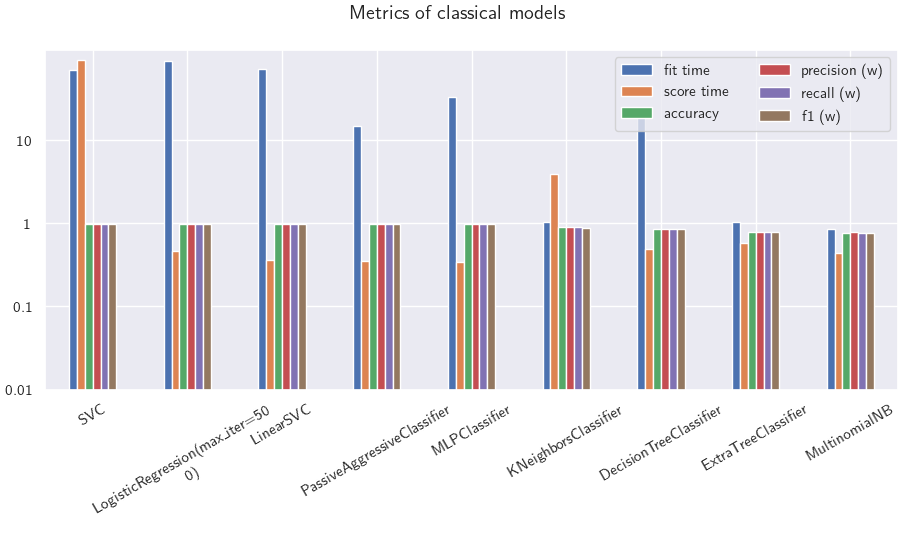

In [19]:
fig = search_report_plot(report_classic, figsize=(11, 4.5))
fig.suptitle('Metrics of classical models')

utils.savefig(DIST_PLOTS / 'metrics_report_classic_models.png', fig)

### Оптимизации классических моделей <a name="models-optimization"></a>

In [417]:
optimized_param_grid = [{
    'clf': [
        RidgeClassifier(random_state=0),  # переход от классификации к регрессии
        SGDClassifier(loss='hinge', random_state=0),  # LinearSVC
        SGDClassifier(loss='log', random_state=0),  # LogisticRegression
        SGDClassifier(loss='modified_huber', random_state=0),  # толерантность к выбросам
        SGDClassifier(loss='squared_hinge', random_state=0),  # SVC с квадратичным штрафом
        SGDClassifier(loss='perceptron', random_state=0),  # MLP
    ]
}]

optimized_search = GridSearchCV(
    simple_pipline,
    optimized_param_grid,
    scoring=SCORING,
    refit='accuracy',
    cv=2,
    verbose=4,
    n_jobs=4,
)

In [418]:
if __name__ == '__main__':
    with warnings.catch_warnings():
        warnings.simplefilter('ignore', category=ConvergenceWarning)
        warnings.simplefilter('ignore', category=UndefinedMetricWarning)
        optimized_search.fit(X_train, y_train)

Fitting 2 folds for each of 6 candidates, totalling 12 fits


In [419]:
report_optimized = search_report_df(optimized_search.cv_results_)
report_optimized

,pipeline,fit time,score time,accuracy,precision (w),recall (w),f1 (w)
0,SGDClassifier(loss='perceptron'),1.808125,0.092947,0.985084,0.985137,0.985084,0.985072
1,SGDClassifier,2.127893,0.118277,0.984752,0.984974,0.984752,0.984736
2,SGDClassifier(loss='modified_huber'),1.904735,0.111000,0.983759,0.983933,0.983759,0.983764
3,SGDClassifier(loss='squared_hinge'),2.015018,0.107908,0.982766,0.983286,0.982766,0.982808
4,SGDClassifier(loss='log'),3.733708,0.128231,0.966528,0.968178,0.966528,0.965784
5,RidgeClassifier,1.190621,0.157724,0.961883,0.962014,0.961883,0.961850


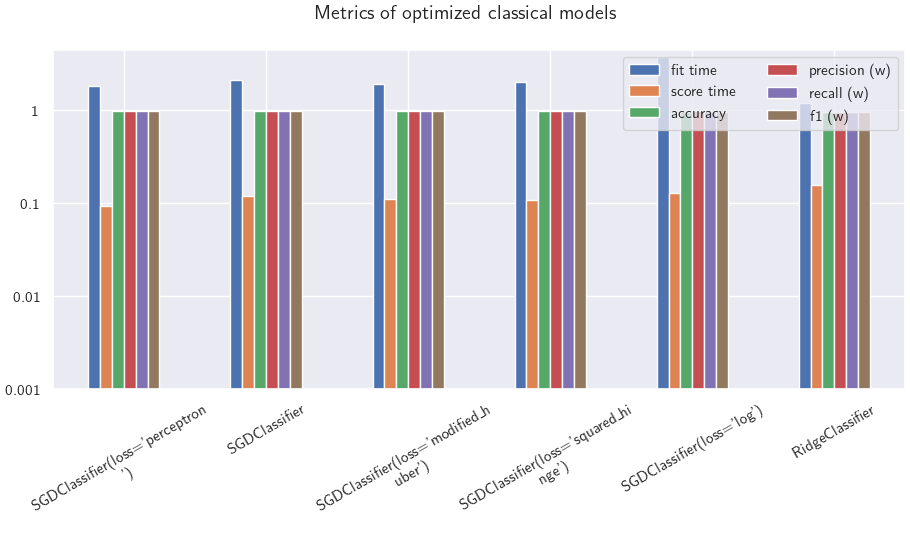

In [478]:
fig = search_report_plot(report_optimized, figsize=(11, 4.5))
fig.suptitle('Metrics of optimized classical models')

utils.savefig(DIST_PLOTS / 'metrics_report_optimized_classic_models.png', fig)

### Ансамблирование моделей <a name="ensemble-models"></a>

In [422]:
ensemble_param_grid = [{
    'clf': [
        # bagging
        RandomForestClassifier(random_state=0),
        ExtraTreesClassifier(random_state=0),

        # boosting
        AdaBoostClassifier(
            base_estimator=DecisionTreeClassifier(max_depth=10),
            n_estimators=10,
            random_state=0
        ),
        AdaBoostClassifier(
            base_estimator=ExtraTreeClassifier(max_depth=5, random_state=0),
            n_estimators=10,
            random_state=0
        ),
        GradientBoostingClassifier(n_estimators=5, max_depth=1, random_state=0),
    ]
}]

ensemble_search = GridSearchCV(
    simple_pipline,
    ensemble_param_grid,
    scoring=SCORING,
    refit='accuracy',
    cv=2,
    verbose=4,
    n_jobs=4,
)

In [423]:
if __name__ == '__main__':
    with warnings.catch_warnings():
        warnings.simplefilter('ignore', category=ConvergenceWarning)
        warnings.simplefilter('ignore', category=UndefinedMetricWarning)
        ensemble_search.fit(X_train, y_train)

Fitting 2 folds for each of 5 candidates, totalling 10 fits


In [424]:
report_ensemble = search_report_df(ensemble_search.cv_results_)
report_ensemble

,pipeline,fit time,score time,accuracy,precision (w),recall (w),f1 (w)
0,ExtraTreesClassifier,2.843485,0.191714,0.991715,0.991782,0.991715,0.991711
1,RandomForestClassifier,4.970924,0.174234,0.989726,0.989847,0.989726,0.989733
2,AdaBoostClassifier(base_estimator=DecisionTree...,49.825383,0.357541,0.925408,0.925758,0.925408,0.925167
3,AdaBoostClassifier(base_estimator=ExtraTreeCla...,1.136849,0.489061,0.792836,0.827202,0.792836,0.799267
4,"GradientBoostingClassifier(max_depth=1, n_esti...",19.506131,0.133583,0.783891,0.788013,0.783891,0.777379


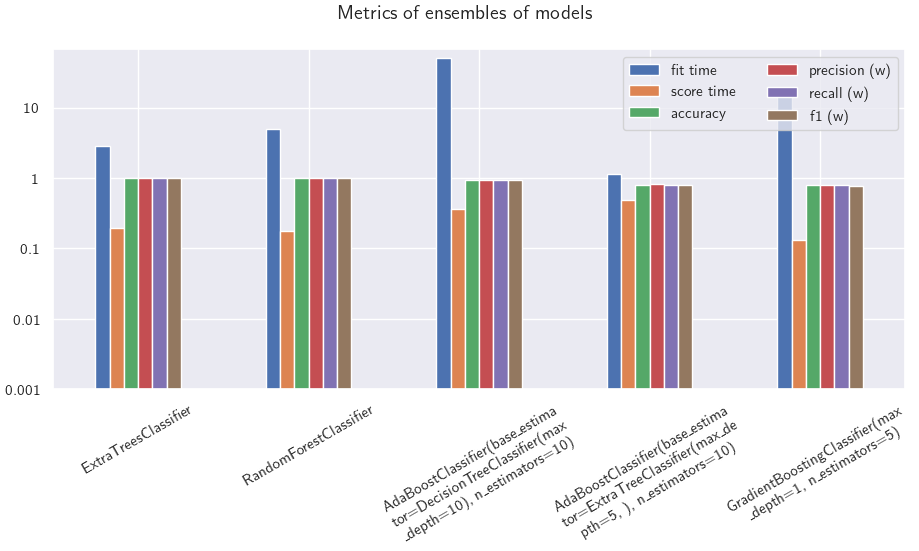

In [479]:
fig = search_report_plot(report_ensemble, figsize=(11, 4.5))
fig.suptitle('Metrics of ensembles of models')

utils.savefig(DIST_PLOTS / 'metrics_report_ensembles_models.png', fig)

In [427]:
merged_cv_results = merge_cv_results(
    classic_search.cv_results_,
    optimized_search.cv_results_,
    ensemble_search.cv_results_
)

In [431]:
merged_report = search_report_df(merged_cv_results, skip=['StandardScaler'])
merged_report

,pipeline,fit time,score time,accuracy,precision (w),recall (w),f1 (w)
0,SVC,15.497597,20.749306,0.993703,0.993763,0.993703,0.993709
1,ExtraTreesClassifier,2.843485,0.191714,0.991715,0.991782,0.991715,0.991711
2,LogisticRegression(max_iter=500),31.209453,0.154136,0.990388,0.990494,0.990388,0.990386
3,SVC(kernel='linear'),5.625604,6.391813,0.990388,0.990481,0.990388,0.990388
4,RandomForestClassifier,4.970924,0.174234,0.989726,0.989847,0.989726,0.989733
5,PassiveAggressiveClassifier,5.475227,0.162572,0.986079,0.986135,0.986079,0.986077
6,MLPClassifier,11.242146,0.126476,0.985415,0.985540,0.985415,0.985411
7,SGDClassifier(loss='perceptron'),1.808125,0.092947,0.985084,0.985137,0.985084,0.985072
8,SGDClassifier,2.127893,0.118277,0.984752,0.984974,0.984752,0.984736
9,SGDClassifier(loss='modified_huber'),1.904735,0.111000,0.983759,0.983933,0.983759,0.983764


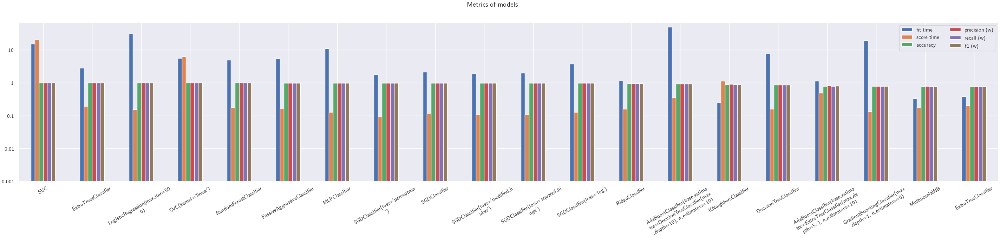

In [481]:
fig = search_report_plot(merged_report, figsize=(36, 6))
fig.suptitle('Metrics of models')

utils.savefig(DIST_PLOTS / 'metrics_merged_report_models.png', fig)

### Уменьшение размерности <a name="dimension-reduction"></a>

In [14]:
class Resizer(BaseEstimator, TransformerMixin):

    def __init__(self, w: int, h: int):
        self.w = w
        self.h = h

    def fit(self, X, y=None):  # noqa
        return self

    def transform(self, X, y=None):  # noqa
        return np.array([cv2.resize(img, (self.w, self.h)) for img in X])


class RGB2GrayTransformer(BaseEstimator, TransformerMixin):

    def __init__(self):
        pass

    def fit(self, X, y=None):  # noqa
        return self

    def transform(self, X, y=None):  # noqa
        return rgb2gray(X)


class HogTransformer(BaseEstimator, TransformerMixin):

    def __init__(self, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(3, 3), block_norm='L2-Hys',
                 channel_axis=None):
        self.orientations = orientations
        self.pixels_per_cell = pixels_per_cell
        self.cells_per_block = cells_per_block
        self.block_norm = block_norm
        self.channel_axis = channel_axis

    def fit(self, X, y=None):  # noqa
        return self

    def transform(self, X, y=None):  # noqa
        def _hog(img):
            return hog(
                img,
                feature_vector=True,
                orientations=self.orientations,
                pixels_per_cell=self.pixels_per_cell,
                cells_per_block=self.cells_per_block,
                block_norm=self.block_norm,
                channel_axis=self.channel_axis
            )

        return np.array([_hog(img) for img in X])


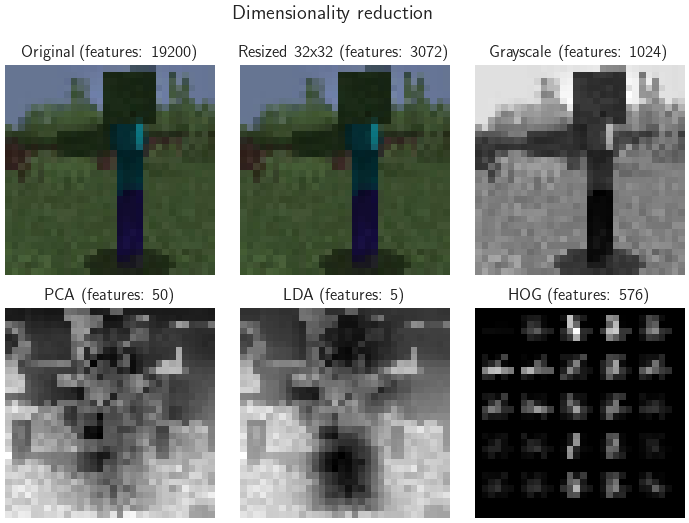

In [145]:
img = dataset['images'][0]

size = (32, 32)

# resize
resized_img = Resizer(*size).fit_transform([img])[0]

# grayscale
gray_img = RGB2GrayTransformer().fit_transform([resized_img])[0]

# PCA
pca_pipeline = Pipeline([
    ('resizer', Resizer(*size)),
    ('grayscale', RGB2GrayTransformer()),
    ('flatter', Flatter()),
    ('scaler', MinMaxScaler()),
    ('pca', PCA(n_components=50, whiten=True)),
])

pca_pipeline.fit(X_train)
pca = pca_pipeline['pca']
pca_img = pca.mean_.reshape(*size)

# LDA
lda_pipeline = Pipeline([
    *pca_pipeline.steps[:-1],
    ('lda', LinearDiscriminantAnalysis()),
])
lda_pipeline.fit(X_train, y_train)
lda = lda_pipeline['lda']
lda_img = lda.means_[0].reshape(*size)

# HOG
hog_features, hog_img = hog(
    gray_img,
    visualize=True,
    feature_vector=True,
    orientations=9,
    pixels_per_cell=(6, 6),
    cells_per_block=(4, 4),
    block_norm='L2-Hys'
)

sample_plot = [
    (resized_img, 'Original', len(img.reshape(-1))),
    (resized_img, 'Resized 32x32', len(resized_img.reshape(-1))),
    (gray_img, 'Grayscale', len(gray_img.reshape(-1))),
    (pca_img, 'PCA', pca.n_components_),
    (lda_img, 'LDA', len(lda.classes_) - 1),
    (hog_img, 'HOG', len(hog_features)),
]

nrows, ncols = 2, 3
fig: Figure = plt.figure(figsize=(utils.rectsize(9, nrows, ncols)))
fig.suptitle('Dimensionality reduction', y=0.98)

grid = ImageGrid(fig, 111, nrows_ncols=(nrows, ncols), axes_pad=(1 / 4, 1 / 3))
for i, (img, title, n_features) in enumerate(sample_plot):
    ax = grid[i]
    utils.reset_axes(ax)
    ax.set_title(f'{title} (features: {n_features})')
    ax.imshow(img, cmap='gray' if len(img.shape) == 2 else None)

utils.savefig(DIST_PLOTS / 'dimensionality_reduction.png', fig)

In [26]:
simple_reduce_dim_pipline = Pipeline([
    ('resizer', None),
    ('grayscale', None),
    ('flatter', Flatter()),
    ('scaler', MinMaxScaler()),
    ('clf', LinearSVC(random_state=0)),
])

In [27]:
simple_reduce_dim_param_grid = [{
    'resizer': [
        Resizer(64, 64),
        Resizer(40, 40),
        Resizer(32, 32),
        Resizer(16, 16),
    ],
    'grayscale': [
        None,
        RGB2GrayTransformer(),
    ],
    'clf': [
        LinearSVC(random_state=0),
        SVC(random_state=0),
    ]
}]

simple_reduce_dim_search = GridSearchCV(
    simple_reduce_dim_pipline,
    simple_reduce_dim_param_grid,
    scoring=SCORING,
    refit='accuracy',
    cv=2,
    verbose=4,
    n_jobs=4,
)

In [28]:
if __name__ == '__main__':
    with warnings.catch_warnings():
        warnings.simplefilter('ignore', category=ConvergenceWarning)
        warnings.simplefilter('ignore', category=UndefinedMetricWarning)
        simple_reduce_dim_search.fit(X_train, y_train)

Fitting 2 folds for each of 16 candidates, totalling 32 fits


In [29]:
report_simple_reduce_dim = search_report_df(simple_reduce_dim_search.cv_results_)
report_simple_reduce_dim

,pipeline,fit time,score time,accuracy,precision (w),recall (w),f1 (w)
0,"Resizer(h=64, w=64)__None__SVC",57.441784,63.049653,0.994034,0.994084,0.994034,0.994038
1,"Resizer(h=40, w=40)__None__SVC",8.745878,13.628438,0.994034,0.994084,0.994034,0.994038
2,"Resizer(h=32, w=32)__None__SVC",5.554748,8.368998,0.994034,0.994081,0.994034,0.994037
3,"Resizer(h=16, w=16)__None__SVC",0.986299,2.274284,0.990719,0.990792,0.990719,0.990717
4,"Resizer(h=32, w=32)__None__LinearSVC",15.380234,0.330761,0.989725,0.989788,0.989725,0.989722
5,"Resizer(h=40, w=40)__None__LinearSVC",21.123079,0.178500,0.988399,0.988460,0.988399,0.988400
6,"Resizer(h=64, w=64)__None__LinearSVC",53.858849,0.287001,0.986742,0.986798,0.986742,0.986744
7,"Resizer(h=16, w=16)__None__LinearSVC",3.922909,0.069499,0.985747,0.985815,0.985747,0.985747
8,"Resizer(h=64, w=64)__RGB2GrayTransformer__SVC",8.050217,12.505640,0.960225,0.960439,0.960225,0.960158
9,"Resizer(h=40, w=40)__RGB2GrayTransformer__SVC",3.075226,4.436178,0.959231,0.959515,0.959231,0.959200


In [30]:
base_pipeline = Pipeline([
    ('resizer', Resizer(32, 32)),
    ('flatter', Flatter()),
    ('scaler', MinMaxScaler()),
])

#### Метод главных компонент (PCA) <a name="pca"></a>

In [31]:
pca_pipeline = Pipeline([
    *base_pipeline.steps,
    ('pca', PCA(n_components=3)),
])

X_pca = pca_pipeline.fit(X_train).transform(X_test)

data = []
for i, mob in enumerate(MOBS):
    cat = X_pca[y_test == i]
    data.append(
        go.Scatter3d(x=cat[:, 0], y=cat[:, 1], z=cat[:, 2], mode='markers', marker={'size': 4}, name=mob, text=[mob]))

fig = go.Figure(data=data)
fig.update_layout(margin=dict(l=0, r=0, b=0, t=15))
iplot(fig)

In [32]:
pca_pipeline = Pipeline([
    *base_pipeline.steps,
    ('pca', PCA(150, random_state=0)),
    ('clf', None),
])

In [33]:
pca_pipeline.fit(X_train, y_train)
pca: PCA = pca_pipeline['pca']

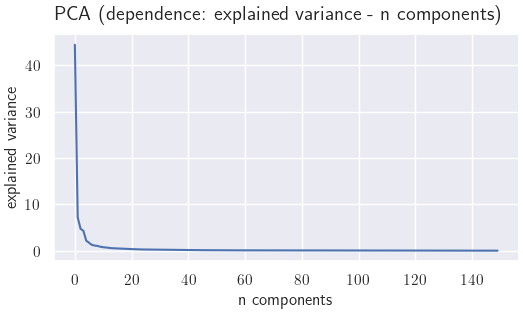

In [34]:
fig, ax = plt.subplots(figsize=(6, 3))
fig.suptitle('PCA (dependence: explained variance - n components)')

sns.lineplot(data=pca.explained_variance_, ax=ax)
ax.set_xlabel('n components')
ax.set_ylabel('explained variance')

utils.savefig(DIST_PLOTS / 'pca__n_components.png', fig)

In [35]:
pca_param_grid = [{
    'pca__n_components': np.arange(30, 110, 5),
    'clf': [
        LinearSVC(random_state=0),
    ]
}]

pca_search = GridSearchCV(
    pca_pipeline,
    pca_param_grid,
    scoring=SCORING,
    refit='accuracy',
    cv=3,
    verbose=4,
    n_jobs=4,
)

In [36]:
if __name__ == '__main__':
    with warnings.catch_warnings():
        warnings.simplefilter('ignore', category=ConvergenceWarning)
        warnings.simplefilter('ignore', category=UndefinedMetricWarning)
        pca_search.fit(X_train, y_train)

Fitting 3 folds for each of 16 candidates, totalling 48 fits


In [37]:
search_report_df(pca_search.cv_results_).head(10)

,pipeline,fit time,score time,accuracy,precision (w),recall (w),f1 (w)
0,60__LinearSVC,2.349317,0.076283,0.988068,0.988184,0.988068,0.988066
1,95__LinearSVC,1.560605,0.114855,0.987405,0.987574,0.987405,0.987410
2,90__LinearSVC,1.504646,0.111794,0.987073,0.987184,0.987073,0.987068
3,70__LinearSVC,1.795825,0.288465,0.986742,0.986888,0.986742,0.986738
4,85__LinearSVC,1.569502,0.119802,0.986742,0.986862,0.986742,0.986741
5,100__LinearSVC,1.767301,0.205879,0.986741,0.986973,0.986741,0.986740
6,65__LinearSVC,1.904201,0.076272,0.986079,0.986249,0.986079,0.986079
7,80__LinearSVC,1.560954,0.115945,0.986079,0.986241,0.986079,0.986074
8,55__LinearSVC,1.984818,0.207998,0.985747,0.985897,0.985747,0.985748
9,105__LinearSVC,2.644302,0.067566,0.985747,0.986020,0.985747,0.985756


#### Линейный дискриминантный анализ (LDA) <a name="lda"></a>

In [38]:
lda_pipeline = Pipeline([
    *base_pipeline.steps,
    ('lda', LinearDiscriminantAnalysis(n_components=3)),
])

X_lda = lda_pipeline.fit(X_train, y_train).transform(X_test)

data = []
for i, mob in enumerate(MOBS):
    cat = X_lda[y_test == i]
    data.append(go.Scatter3d(
        x=cat[:, 0],
        y=cat[:, 1],
        z=cat[:, 2],
        mode='markers',
        marker={'size': 4},
        name=mob,
        text=[mob])
    )

fig = go.Figure(data=data)
fig.update_layout(margin=dict(l=0, r=0, b=0, t=15))
iplot(fig)

In [39]:
lda_pipeline = Pipeline([
    *base_pipeline.steps,
    ('lda', LinearDiscriminantAnalysis()),
    ('clf', None),
])

In [40]:
lda_pipeline.fit(X_train, y_train)
lda: LinearDiscriminantAnalysis = lda_pipeline['lda']

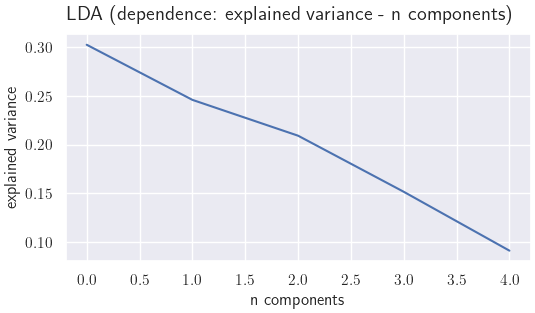

In [41]:
fig, ax = plt.subplots(figsize=(6, 3))
fig.suptitle('LDA (dependence: explained variance - n components)')

sns.lineplot(data=lda.explained_variance_ratio_, ax=ax)
ax.set_xlabel('n components')
ax.set_ylabel('explained variance')

utils.savefig(DIST_PLOTS / 'lda__n_components.png', fig)

#### Гистограмма направленных градиентов (HOG) <a name="hog"></a>

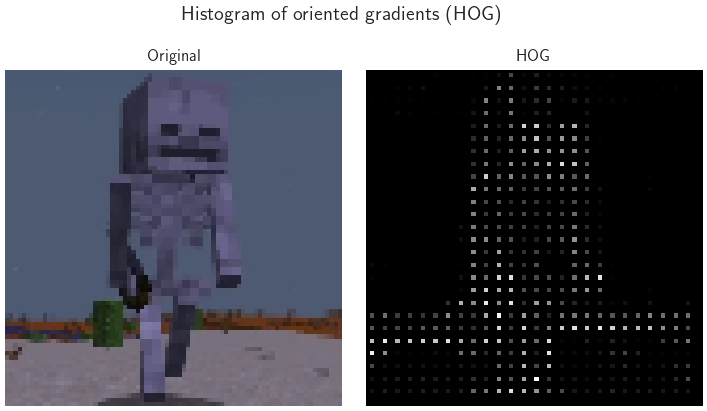

In [165]:
img = dataset['images'][933]

_, hog_img = hog(
    rgb2gray(img),
    visualize=True,
    feature_vector=True,
    orientations=9,
    pixels_per_cell=(3, 3),
    cells_per_block=(4, 4),
    block_norm='L2-Hys'
)

sample_plot = [
    (img, 'Original'),
    (hog_img, 'HOG'),
]

nrows, ncols = 1, 2
fig: Figure = plt.figure(figsize=(utils.rectsize(9, nrows, ncols)))
fig.suptitle('Histogram of oriented gradients (HOG)', y=1.02)

grid = ImageGrid(fig, 111, nrows_ncols=(nrows, ncols), axes_pad=(1 / 4, 1 / 3))
for ax, (img, title) in zip(grid, sample_plot):
    utils.reset_axes(ax)
    ax.set_title(title)
    ax.imshow(img, cmap='gray' if len(img.shape) == 2 else None)

utils.savefig(DIST_PLOTS / 'hog.png', fig)

In [46]:
hog_pipeline = Pipeline([
    ('resizer', Resizer(40, 40)),
    ('grayscale', RGB2GrayTransformer()),
    ('hog', HogTransformer()),
    ('flatter', Flatter()),
    ('scaler', MinMaxScaler()),
    ('clf', LinearSVC(random_state=0)),
])

In [47]:
hog_param_grid = [{
    'hog__pixels_per_cell': [(i, i) for i in np.arange(5, 11)],
    'hog__cells_per_block': [(i, i) for i in np.arange(2, 5)],
}]

hog_search = GridSearchCV(
    hog_pipeline,
    hog_param_grid,
    scoring=SCORING,
    refit='accuracy',
    cv=2,
    verbose=4,
    n_jobs=4,
)

In [48]:
if __name__ == '__main__':
    with warnings.catch_warnings():
        warnings.simplefilter('ignore', category=ConvergenceWarning)
        warnings.simplefilter('ignore', category=UndefinedMetricWarning)
        hog_search.fit(X_train, y_train)

Fitting 2 folds for each of 18 candidates, totalling 36 fits


In [49]:
search_report_df(hog_search.cv_results_)

,pipeline,fit time,score time,accuracy,precision (w),recall (w),f1 (w)
0,"(5, 5)__(2, 2)",10.917005,4.758534,0.952934,0.952993,0.952934,0.952828
1,"(5, 5)__(3, 3)",7.979862,3.652986,0.952269,0.952400,0.952269,0.952245
2,"(5, 5)__(4, 4)",8.722869,3.231510,0.944315,0.944420,0.944315,0.944288
3,"(6, 6)__(3, 3)",5.843955,2.335499,0.926417,0.926880,0.926417,0.926484
4,"(6, 6)__(2, 2)",6.691112,3.728807,0.921778,0.922061,0.921778,0.921692
5,"(6, 6)__(4, 4)",5.763467,1.724027,0.921777,0.921778,0.921777,0.921634
6,"(9, 9)__(4, 4)",1.267496,0.902499,0.918130,0.918260,0.918130,0.917939
7,"(9, 9)__(2, 2)",3.052500,2.226498,0.915477,0.915815,0.915477,0.915328
8,"(8, 8)__(3, 3)",4.296138,1.748814,0.913157,0.913486,0.913157,0.913125
9,"(10, 10)__(2, 2)",3.079621,1.541967,0.912826,0.913150,0.912826,0.912685


### Регуляризация <a name="regularization"></a>

In [32]:
svc_pipeline = Pipeline([
    ('resizer', Resizer(32, 32)),
    ('flatter', Flatter()),
    ('scaler', MinMaxScaler()),
    ('pca', PCA(n_components=60, random_state=0)),
    ('clf', LinearSVC(random_state=0)),
])

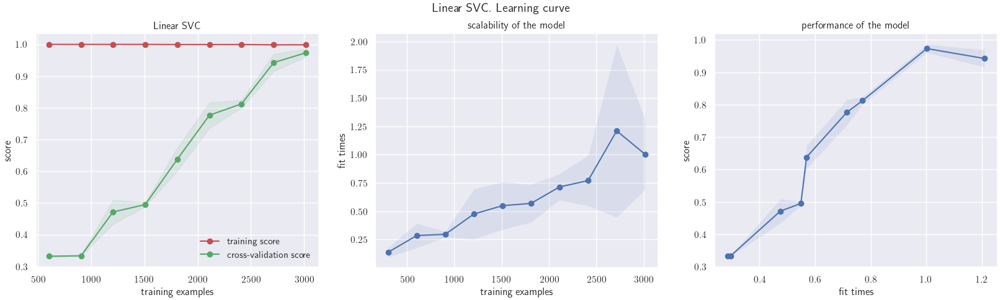

In [35]:
with warnings.catch_warnings():
    warnings.simplefilter('ignore', category=ConvergenceWarning)
    fig = utils.plot_learning_curve(svc_pipeline, 'Linear SVC', X, y, cv=5)

fig.suptitle('Linear SVC. Learning curve')
utils.savefig(DIST_PLOTS / 'LinearSVC_learning_curve.png', fig)

In [72]:
rgl_pipeline = Pipeline([
    ('resizer', Resizer(32, 32)),
    ('flatter', Flatter()),
    ('scaler', MinMaxScaler()),
    ('pca', PCA(n_components=60, random_state=0)),
    ('clf', LinearSVC(random_state=0)),
])

In [73]:
rgl_param_grid = [{
    'clf__C': [0.0001, 0.001, 0.05, 0.1, 0.5, 1, 2, 4, 10, 50, 100, 200]
}]

rgl_search = GridSearchCV(
    rgl_pipeline,
    rgl_param_grid,
    scoring=SCORING,
    refit='accuracy',
    cv=3,
    verbose=4,
    n_jobs=4,
    return_train_score=True
)

In [74]:
if __name__ == '__main__':
    with warnings.catch_warnings():
        warnings.simplefilter('ignore', category=ConvergenceWarning)
        warnings.simplefilter('ignore', category=UndefinedMetricWarning)
        rgl_search.fit(X_train, y_train)

Fitting 3 folds for each of 12 candidates, totalling 36 fits


In [75]:
report_rgl = search_report_df(rgl_search.cv_results_)
report_rgl

,pipeline,fit time,score time,accuracy,precision (w),recall (w),f1 (w)
2,0.05,2.891037,0.468217,0.989725,0.989823,0.989725,0.989719
3,0.1,3.135475,0.097508,0.989062,0.989149,0.989062,0.989053
4,0.5,1.363986,0.099671,0.989062,0.989134,0.989062,0.989055
5,1,1.295293,0.098539,0.988068,0.988199,0.988068,0.988064
6,2,1.274155,0.107727,0.986410,0.986561,0.986410,0.986411
7,4,1.302481,0.092482,0.983759,0.983913,0.983759,0.983763
8,10,1.245774,0.094698,0.982101,0.982275,0.982101,0.982111
10,100,1.244383,0.111310,0.980443,0.980613,0.980443,0.980457
9,50,1.252531,0.103633,0.979780,0.979939,0.979780,0.979773
11,200,1.349493,0.076120,0.979117,0.979274,0.979117,0.979121


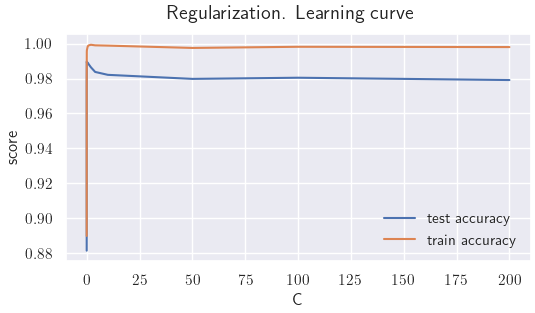

In [76]:
data = report_rgl.join(pd.DataFrame(rgl_search.cv_results_)[['mean_train_accuracy']])
data = data[['pipeline', 'accuracy', 'mean_train_accuracy']]
data = data.rename(
    columns={'pipeline': 'C', 'accuracy': 'test accuracy', 'mean_train_accuracy': 'train accuracy'})
data = pd.melt(data.sort_values('C'), id_vars='C', value_vars=['test accuracy', 'train accuracy'])
data[['C', 'value']] = data[['C', 'value']].astype(float)

fig, ax = plt.subplots(figsize=(6, 3))
fig.suptitle('Regularization. Learning curve')
sns.lineplot(data=data, x='C', y='value', hue='variable', ax=ax)
ax.set_ylabel('score')
ax.legend(title='')

utils.savefig(DIST_PLOTS / 'regularization_learning_curve.png', fig)

In [77]:
rgl_param_grid = [{
    'clf__C': np.linspace(0.006, 0.11, 20)
}]

rgl_search = GridSearchCV(
    rgl_pipeline,
    rgl_param_grid,
    scoring=SCORING,
    refit='accuracy',
    cv=3,
    verbose=4,
    n_jobs=4,
)

In [78]:
if __name__ == '__main__':
    with warnings.catch_warnings():
        warnings.simplefilter('ignore', category=ConvergenceWarning)
        warnings.simplefilter('ignore', category=UndefinedMetricWarning)
        rgl_search.fit(X_train, y_train)

Fitting 3 folds for each of 20 candidates, totalling 60 fits


In [79]:
search_report_df(rgl_search.cv_results_)

,pipeline,fit time,score time,accuracy,precision (w),recall (w),f1 (w)
7,0.044315789473684204,1.380837,0.102085,0.989725,0.989823,0.989725,0.989719
8,0.04978947368421052,1.614580,0.093088,0.989725,0.989823,0.989725,0.989719
9,0.05526315789473684,1.611623,0.083029,0.989725,0.989823,0.989725,0.989719
10,0.06073684210526315,1.566681,0.086360,0.989394,0.989495,0.989394,0.989385
13,0.0771578947368421,1.445398,0.083642,0.989394,0.989495,0.989394,0.989385
14,0.08263157894736842,1.557683,0.114088,0.989394,0.989476,0.989394,0.989382
11,0.06621052631578947,1.548932,0.079707,0.989394,0.989495,0.989394,0.989385
12,0.0716842105263158,1.544793,0.077406,0.989394,0.989495,0.989394,0.989385
17,0.09905263157894736,1.882867,0.589861,0.989062,0.989149,0.989062,0.989053
16,0.09357894736842105,1.721640,0.095474,0.989062,0.989134,0.989062,0.989051


### Выбор лучшей <a name="best-model"></a>

In [81]:
best_pipeline = Pipeline([
    ('resizer', Resizer(32, 32)),
    ('grayscale', None),
    ('flatter', Flatter()),
    ('scaler', MinMaxScaler()),
    ('pca', None),
    ('clf', LinearSVC(random_state=0)),
])

In [87]:
resizer = [
    Resizer(16, 16),
    Resizer(32, 32),
    Resizer(48, 48),
]
clf = [
    LogisticRegression(max_iter=500, random_state=0),
    ExtraTreeClassifier(random_state=0),
    RandomForestClassifier(random_state=0),
    RidgeClassifier(random_state=0),
    PassiveAggressiveClassifier(random_state=0),
    SGDClassifier(loss='hinge', random_state=0),
    SGDClassifier(loss='log', random_state=0),
    SGDClassifier(loss='modified_huber', random_state=0),
    SGDClassifier(loss='squared_hinge', random_state=0),
    SGDClassifier(loss='perceptron', random_state=0),
]

mlp_preset = {
    'scaler': [StandardScaler()],
    'clf': [MLPClassifier(random_state=0)],
}

best_param_grid = [
    {  # best LinearSVC
        'resizer': [Resizer(32, 32)],
        'pca': [PCA(n_components=60)],
        'clf': [LinearSVC(C=0.05, random_state=0)],
    },
    {  # all models with resizer
        'resizer': resizer,
        'clf': clf,
    },
    {  # + MLPClassifier
        'resizer': resizer,
        **mlp_preset,
    },
    {  # all models with resizer, grayscale
        'resizer': resizer,
        'grayscale': [RGB2GrayTransformer()],
        'clf': clf,
    },
    {  # + MLPClassifier
        'resizer': resizer,
        'grayscale': [RGB2GrayTransformer()],
        **mlp_preset,
    },
    {  # all models with resizer, pca
        'resizer': resizer,
        'pca': [PCA(n_components=60)],
        'clf': clf,
    },
    {  # + MLPClassifier
        'resizer': resizer,
        'pca': [PCA(n_components=60)],
        **mlp_preset,
    },
]

best_search = GridSearchCV(
    best_pipeline,
    best_param_grid,
    scoring=SCORING,
    refit='accuracy',
    cv=2,
    verbose=4,
    n_jobs=4,
)

In [88]:
if __name__ == '__main__':
    with warnings.catch_warnings():
        warnings.simplefilter('ignore', category=ConvergenceWarning)
        warnings.simplefilter('ignore', category=UndefinedMetricWarning)
        best_search.fit(X_train, y_train)

Fitting 2 folds for each of 100 candidates, totalling 200 fits


In [101]:
report_best = search_report_df(best_search.cv_results_)
report_best

,pipeline,fit time,score time,accuracy,precision (w),recall (w),f1 (w)
7,"Resizer(h=16, w=16)__RandomForestClassifier",2.247357,0.128903,0.991714,0.991836,0.991714,0.991718
9,"Resizer(h=48, w=48)__RandomForestClassifier",8.024575,0.374464,0.991051,0.991143,0.991051,0.991054
3,"Resizer(h=48, w=48)__LogisticRegression(max_it...",31.991282,0.358877,0.991051,0.991138,0.991051,0.991047
2,"Resizer(h=32, w=32)__LogisticRegression(max_it...",12.285954,0.141406,0.990720,0.990793,0.990720,0.990711
8,"Resizer(h=32, w=32)__RandomForestClassifier",5.064230,0.164799,0.990387,0.990452,0.990387,0.990388
...,...,...,...,...,...,...,...
38,"Resizer(h=32, w=32)__RGB2GrayTransformer__Extr...",0.195000,0.108002,0.696050,0.698627,0.696050,0.696819
37,"Resizer(h=16, w=16)__RGB2GrayTransformer__Extr...",0.121998,0.048000,0.679488,0.682673,0.679488,0.679655
71,"Resizer(h=32, w=32)__PCA(n_components=60)__Ext...",0.827702,0.153044,0.552201,0.552569,0.552201,0.550914
72,"Resizer(h=48, w=48)__PCA(n_components=60)__Ext...",2.158982,0.379943,0.520719,0.521110,0.520719,0.519644


In [104]:
report_best['accuracy'] = report_best['accuracy'].round(2)
report_best.sort_values(['accuracy', 'score time'], ascending=[False, True]).head(20)

,pipeline,fit time,score time,accuracy,precision (w),recall (w),f1 (w)
13,"Resizer(h=16, w=16)__PassiveAggressiveClassifier",0.697808,0.037790,0.99,0.986848,0.986742,0.986741
97,"StandardScaler__Resizer(h=16, w=16)__PCA(n_com...",3.754387,0.044828,0.99,0.986564,0.986411,0.986405
1,"Resizer(h=16, w=16)__LogisticRegression(max_it...",1.969144,0.045316,0.99,0.987193,0.987074,0.987066
14,"Resizer(h=32, w=32)__PassiveAggressiveClassifier",2.623896,0.064497,0.99,0.987472,0.987404,0.987402
31,"StandardScaler__Resizer(h=16, w=16)__MLPClassi...",3.662923,0.065406,0.99,0.987482,0.987405,0.987393
23,"Resizer(h=32, w=32)__SGDClassifier(loss='modif...",0.916159,0.081626,0.99,0.985858,0.985747,0.985728
7,"Resizer(h=16, w=16)__RandomForestClassifier",2.247357,0.128903,0.99,0.991836,0.991714,0.991718
68,"Resizer(h=32, w=32)__PCA(n_components=60)__Log...",1.171218,0.133999,0.99,0.988157,0.988068,0.988072
0,"Resizer(h=32, w=32)__PCA(n_components=60)__Lin...",0.981387,0.136255,0.99,0.990152,0.990056,0.990065
2,"Resizer(h=32, w=32)__LogisticRegression(max_it...",12.285954,0.141406,0.99,0.990793,0.990720,0.990711


In [105]:
report_best.sort_values(['score time', 'accuracy'], ascending=[True, False]).head(20)

,pipeline,fit time,score time,accuracy,precision (w),recall (w),f1 (w)
16,"Resizer(h=16, w=16)__SGDClassifier",0.321931,0.022551,0.98,0.976461,0.975805,0.975869
49,"Resizer(h=16, w=16)__RGB2GrayTransformer__SGDC...",0.224372,0.022658,0.85,0.868099,0.851829,0.850537
55,"Resizer(h=16, w=16)__RGB2GrayTransformer__SGDC...",0.231883,0.026597,0.88,0.874673,0.874710,0.874087
28,"Resizer(h=16, w=16)__SGDClassifier(loss='perce...",0.349409,0.027498,0.98,0.975594,0.975143,0.975143
52,"Resizer(h=16, w=16)__RGB2GrayTransformer__SGDC...",0.310068,0.028000,0.88,0.882352,0.877692,0.877240
46,"Resizer(h=16, w=16)__RGB2GrayTransformer__Pass...",0.285000,0.028000,0.85,0.857520,0.849524,0.848085
61,"Resizer(h=16, w=16)__RGB2GrayTransformer__SGDC...",0.282499,0.028500,0.84,0.862654,0.837259,0.836616
25,"Resizer(h=16, w=16)__SGDClassifier(loss='squar...",0.328882,0.030000,0.97,0.972504,0.972158,0.972144
13,"Resizer(h=16, w=16)__PassiveAggressiveClassifier",0.697808,0.037790,0.99,0.986848,0.986742,0.986741
76,"Resizer(h=16, w=16)__PCA(n_components=60)__Rid...",0.284465,0.037849,0.98,0.976147,0.975805,0.975813


In [258]:
best_sgd = Pipeline([
    ('resizer', Resizer(16, 16)),
    ('flatter', Flatter()),
    ('scaler', MinMaxScaler()),
    ('clf', CalibratedClassifierCV(SGDClassifier(random_state=0), cv=3)),
])
best_pa = Pipeline([
    ('resizer', Resizer(16, 16)),
    ('flatter', Flatter()),
    ('scaler', MinMaxScaler()),
    ('clf', CalibratedClassifierCV(PassiveAggressiveClassifier(random_state=0), cv=3)),
])
best_svc_calibrated = Pipeline([
    ('resizer', Resizer(32, 32)),
    ('flatter', Flatter()),
    ('scaler', MinMaxScaler()),
    ('pca', PCA(n_components=60)),
    ('clf', CalibratedClassifierCV(LinearSVC(C=0.05, random_state=0), cv=3)),
])
best_svc = Pipeline([
    ('resizer', Resizer(32, 32)),
    ('flatter', Flatter()),
    ('scaler', MinMaxScaler()),
    ('pca', PCA(n_components=60)),
    ('clf', SVC(kernel='linear', C=0.05, probability=True, random_state=0)),
])

In [15]:
def timeit_(call, n: int = 20) -> float:
    return timeit.timeit(call, number=n) / n

In [260]:
best_sgd.fit(X_train, y_train)

best_pa.fit(X_train, y_train)

best_svc_calibrated.fit(X_train, y_train)

best_svc.fit(X_train, y_train)

print(
    f'Fit time:\n'
    f'SGDClassifier: {timeit_(lambda: best_sgd.fit(X_train, y_train)):.6f} s\n'
    f'PassiveAggressiveClassifier: {timeit_(lambda: best_pa.fit(X_train, y_train)):.6f} s\n'
    f'LinearSVC: {timeit_(lambda: best_svc_calibrated.fit(X_train, y_train)):.6f} s\n'
    f'SVC("linear"): {timeit_(lambda: best_svc.fit(X_train, y_train)):.6f} s'
)

Fit time:
SGDClassifier: 1.095342 s
PassiveAggressiveClassifier: 1.839238 s
LinearSVC: 0.989065 s
SVC("linear"): 1.098742 s


In [262]:
sgd_pred = best_sgd.predict(X_test)

pa_pred = best_pa.predict(X_test)

svc_clb_pred = best_svc_calibrated.predict(X_test)

svc_pred = best_svc.predict(X_test)

print(
    f'Predict time:\n'
    f'SGDClassifier: {timeit_(lambda: best_sgd.predict(X_test), n=100):.6f} s\n'
    f'PassiveAggressiveClassifier: {timeit_(lambda: best_pa.predict(X_test), n=100):.6f} s\n'
    f'LinearSVC: {timeit_(lambda: best_svc_calibrated.predict(X_test), n=100):.6f} s\n'
    f'SVC("linear"): {timeit_(lambda: best_svc.fit(X_train, y_train)):.6f} s'
)

Predict time:
SGDClassifier: 0.014744 s
PassiveAggressiveClassifier: 0.016608 s
LinearSVC: 0.045849 s
SVC("linear"): 1.571149 s


In [139]:
# SGDClassifier
print(metrics.classification_report(y_test, sgd_pred, digits=3, target_names=MOBS, zero_division=0))

              precision    recall  f1-score   support

      zombie      0.992     0.992     0.992       126
    skeleton      0.992     0.992     0.992       127
      spider      1.000     0.976     0.988       124
     creeper      0.969     0.992     0.980       126
    enderman      0.977     0.992     0.984       126
       slime      1.000     0.984     0.992       126

    accuracy                          0.988       755
   macro avg      0.988     0.988     0.988       755
weighted avg      0.988     0.988     0.988       755



In [140]:
# PassiveAggressiveClassifier
print(metrics.classification_report(y_test, pa_pred, digits=3, target_names=MOBS, zero_division=0))

              precision    recall  f1-score   support

      zombie      0.992     0.984     0.988       126
    skeleton      0.984     1.000     0.992       127
      spider      1.000     0.968     0.984       124
     creeper      0.976     0.984     0.980       126
    enderman      0.977     0.992     0.984       126
       slime      0.992     0.992     0.992       126

    accuracy                          0.987       755
   macro avg      0.987     0.987     0.987       755
weighted avg      0.987     0.987     0.987       755



In [141]:
# LinearSVC
print(metrics.classification_report(y_test, svc_pred, digits=3, target_names=MOBS, zero_division=0))

              precision    recall  f1-score   support

      zombie      0.992     0.992     0.992       126
    skeleton      0.992     1.000     0.996       127
      spider      0.992     0.992     0.992       124
     creeper      0.992     0.992     0.992       126
    enderman      0.992     0.984     0.988       126
       slime      0.992     0.992     0.992       126

    accuracy                          0.992       755
   macro avg      0.992     0.992     0.992       755
weighted avg      0.992     0.992     0.992       755



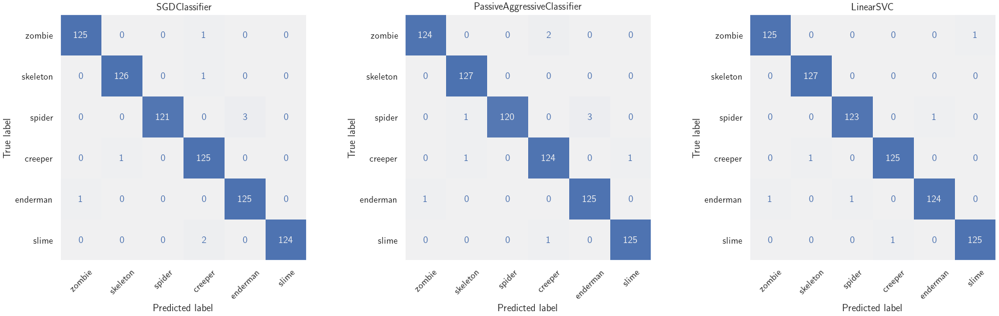

In [153]:
fig, axes = plt.subplots(1, 3, figsize=utils.rectsize(20, 1, 3))
fig.subplots_adjust(wspace=0.4)

data = [(sgd_pred, 'SGDClassifier'), (pa_pred, 'PassiveAggressiveClassifier'), (svc_pred, 'LinearSVC')]

for ax, (y_pred, t) in zip(axes, data):
    ax.grid(False)
    ax.set_title(t)
    cm_display = metrics.ConfusionMatrixDisplay.from_predictions(
        y_test,
        y_pred,
        display_labels=MOBS,
        colorbar=False,
        xticks_rotation=45,
        cmap=sns.color_palette('light:b', as_cmap=True),
        ax=ax,
    )

utils.savefig(DIST_PLOTS / 'best_models_confusion_matrix.png', fig)

## Бинарная классификация <a name="bin-classification"></a>

In [16]:
def fw_back_edges_sliding(
        w: int,
        h: int,
        left: int = None,
        top: int = None,
        right: int = None,
        bottom: int = None,
) -> List[utils.BBox]:
    bboxes = []

    if left:
        for i in range(h // left):
            bboxes.append([0, i * left, left, left])
            bboxes.append([0, (h - left) - i * left, left, left])

    if top:
        for i in range(w // top):
            bboxes.append([i * top, 0, top, top])
            bboxes.append([(h - top) - i * top, 0, top, top])

    if right:
        for i in range(h // right):
            bboxes.append([w - right, i * right, right, right])
            bboxes.append([w - right, (h - right) - i * right, right, right])

    if bottom:
        for i in range(w // bottom):
            bboxes.append([i * bottom, h - bottom, bottom, bottom])
            bboxes.append([(h - bottom) - i * bottom, h - bottom, bottom, bottom])

    return [utils.BBox(*utils.xywh2xywhn(b, w, h), img_h=h, img_w=w) for b in bboxes]


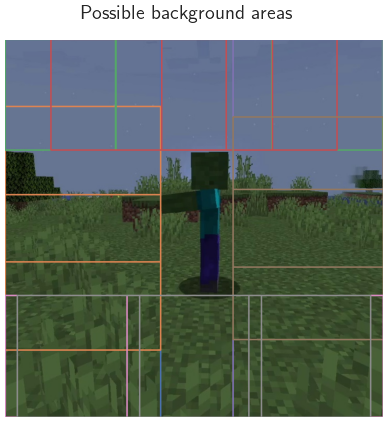

In [17]:
img = utils.Image.open((DATA_IMAGES_ORIG / TIDY_IMAGE_NAMES[0]).with_suffix('.jpg'))
label = utils.Label.open((DATA_LABELS / TIDY_IMAGE_NAMES[0]).with_suffix('.txt'))
ltrb = np.abs(np.array([0, 0, img.w, img.h]) - label.bbox.xyxy(img.w, img.h)).astype(int)
bboxes = fw_back_edges_sliding(img.w, img.h, *ltrb)

tags_sample = ['_'.join(i) for i in product('ltrb', ['fw', 'back'])]
tags = np.array(tags_sample).repeat((np.array([img.h, img.w, img.h, img.w]) // ltrb).repeat(2))
palette = [np.array(i) * 255 for i in sns.color_palette(n_colors=len(bboxes))]

img = img.data
for bbox, tag in zip(bboxes, tags):
    img = utils.visualize_bbox(img, bbox, color=palette[tags_sample.index(tag)])

fig, ax = plt.subplots(figsize=(5, 5))
fig.suptitle('Possible background areas', y=0.95)
utils.reset_axes(ax)
ax.imshow(img)

utils.savefig(DIST_PLOTS / 'background_areas.png', fig)

In [18]:
THRESHOLD = 198

dataset['background'] = []
for name in tqdm(TIDY_IMAGE_NAMES):
    img = utils.Image.open((DATA_IMAGES_YOLO / name).with_suffix('.jpg'))
    label = utils.Label.open((DATA_LABELS / name).with_suffix('.txt'))

    ltrb = [
        i if i > THRESHOLD else None
        for i in np.abs(np.array([0, 0, img.w, img.h]) - label.bbox.xyxy(img.w, img.h)).astype(int)
    ]
    bboxes = fw_back_edges_sliding(img.w, img.h, *ltrb)
    for bbox in bboxes:
        new_img = cv2.resize(utils.crop(img.data, bbox), (TARGET_SIZE, TARGET_SIZE))
        dataset['background'].append(new_img)

print(f'background instances: {len(dataset["background"])}\n'
      f'mobs instances: {len(dataset["images"])}')

  0%|          | 0/3772 [00:00<?, ?it/s]

background instances: 3950
mobs instances: 3772


In [19]:
dataset['background'] = RANDOM.choice(
    np.array(dataset['background'], dtype='uint8'),
    size=len(dataset['images']),
    replace=len(dataset["background"]) < len(dataset["images"])
)
print(f'background instances: {len(dataset["background"])}\n'
      f'mobs instances: {len(dataset["images"])}')

background instances: 3772
mobs instances: 3772


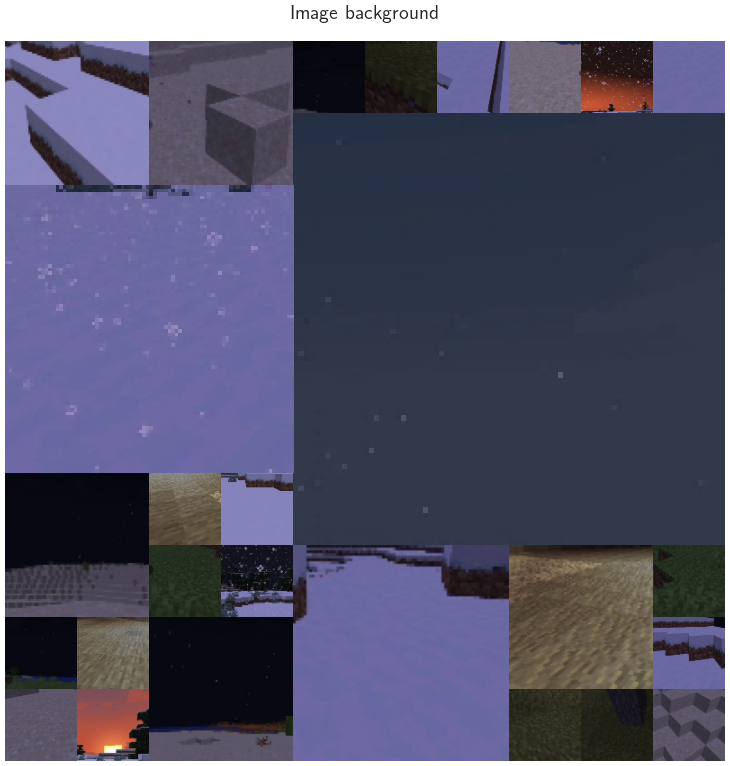

In [173]:
background_27 = dataset['background'][:27]
fig = MOSAIC_27.plot(background_27, fig_width=9)
fig.suptitle('Image background', y=0.94)

utils.savefig(DIST_PLOTS / 'background_mosaic.png', fig)

### Расширение мультиклассовой задачи <a name="extension-multi"></a>

In [414]:
CLASSES = [*MOBS, 'background']

_n = 630
X = np.vstack([dataset['images'], RANDOM.choice(dataset['background'], size=_n)])
y = np.hstack([dataset['target'], np.repeat([len(MOBS)], _n)])

X_train, X_test, y_train, y_test = train_test_split(X, y, shuffle=True, test_size=0.2, stratify=y, random_state=0)

In [415]:
sgd = Pipeline([
    ('resizer', Resizer(16, 16)),
    ('flatter', Flatter()),
    ('scaler', MinMaxScaler()),
    ('clf', SGDClassifier(random_state=0)),
])

In [416]:
sgd.fit(X_train, y_train)
sgd_calibrated = CalibratedClassifierCV(sgd, cv='prefit')
sgd_calibrated.fit(X_train, y_train);

In [335]:
y_pred = sgd_calibrated.predict(background_27)
y_true = [len(CLASSES) - 1] * len(y_pred)
y_decision_f = MinMaxScaler().fit_transform(sgd.decision_function(background_27))
y_pred_proba = sgd_calibrated.predict_proba(background_27)

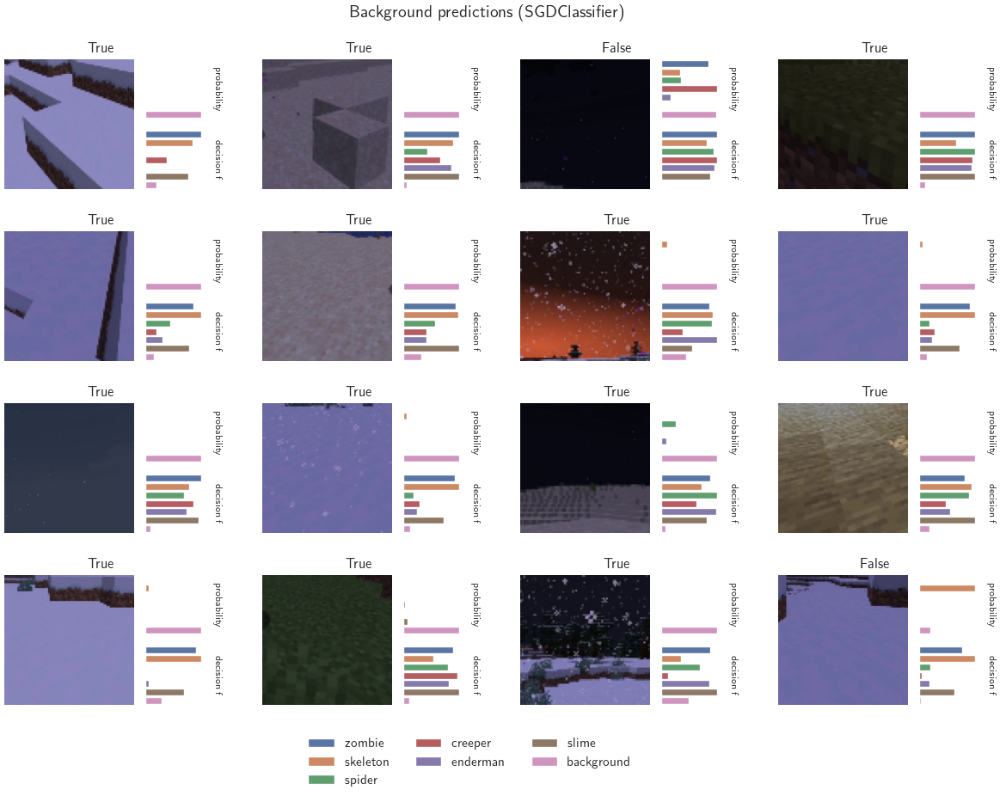

In [336]:
nrows, ncols = 4, 4
fig = utils.plot_probability_grid(
    nrows=nrows,
    ncols=ncols,
    idxs=np.arange(nrows * ncols),
    y_true=y_true,
    y_pred=y_pred,
    proba=y_pred_proba,
    decision_f=y_decision_f,
    images=background_27,
    labels=CLASSES,
    figsize=(3 * nrows, 2 * ncols),
)
fig.suptitle('Background predictions (SGDClassifier)', y=1.05)

utils.savefig(DIST_PLOTS / 'with_background_predict_probability.png', fig)

In [340]:
y_pred = sgd_calibrated.predict(X_test)

In [341]:
print(metrics.classification_report(y_test, y_pred, digits=3, target_names=CLASSES, zero_division=0))

              precision    recall  f1-score   support

      zombie      1.000     0.984     0.992       126
    skeleton      0.946     0.969     0.957       127
      spider      0.938     0.968     0.952       124
     creeper      0.969     0.992     0.980       126
    enderman      0.976     0.984     0.980       126
       slime      0.984     0.984     0.984       126
  background      0.940     0.873     0.905       126

    accuracy                          0.965       881
   macro avg      0.965     0.965     0.965       881
weighted avg      0.965     0.965     0.965       881



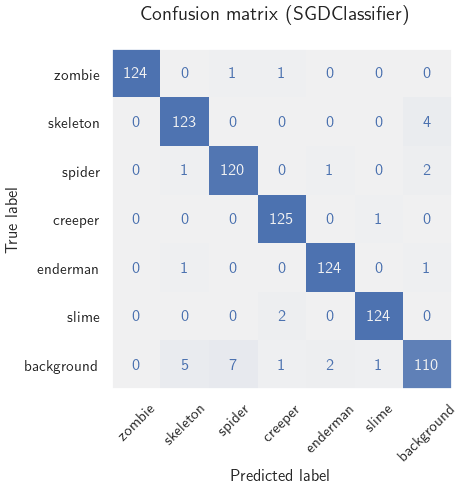

In [339]:
cm_display = metrics.ConfusionMatrixDisplay.from_predictions(
    y_test,
    y_pred,
    display_labels=CLASSES,
    colorbar=False,
    xticks_rotation=45,
    cmap=sns.color_palette('light:b', as_cmap=True)
)
cm_display.ax_.grid(False)
cm_display.figure_.set_size_inches(4.5, 4.5)
cm_display.figure_.suptitle('Confusion matrix (SGDClassifier)')

utils.savefig(DIST_PLOTS / 'sgd_classifier_with_background_confusion_matrix.png', cm_display.figure_)

#### Постановка задачи бинарной классификации <a name="bin-task"></a>

In [194]:
CLASSES = ['mob', 'background']

X = np.vstack([dataset['images'], dataset['background']])
y = np.hstack([np.ones(len(dataset['images'])), np.zeros(len(dataset['background']))])

X_train, X_test, y_train, y_test = train_test_split(X, y, shuffle=True, test_size=0.2, random_state=0)

In [195]:
sgd = Pipeline([
    ('resizer', Resizer(16, 16)),
    ('flatter', Flatter()),
    ('scaler', MinMaxScaler()),
    ('clf', SGDClassifier(random_state=0)),
])

In [196]:
sgd.fit(X_train, y_train);

In [197]:
y_pred = sgd.predict(X_test)

In [198]:
print(metrics.classification_report(y_test, y_pred, digits=3, target_names=CLASSES, zero_division=0))

              precision    recall  f1-score   support

         mob      0.947     0.947     0.947       759
  background      0.947     0.947     0.947       750

    accuracy                          0.947      1509
   macro avg      0.947     0.947     0.947      1509
weighted avg      0.947     0.947     0.947      1509



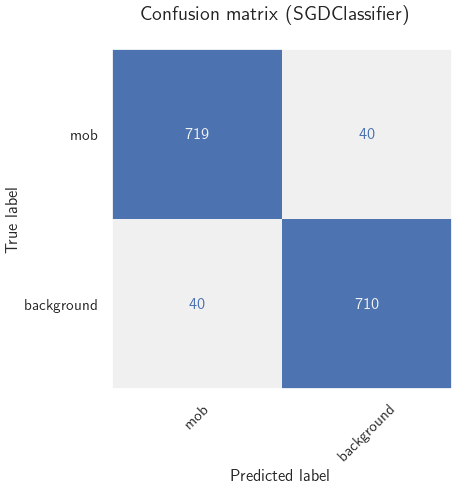

In [199]:
cm_display = metrics.ConfusionMatrixDisplay.from_predictions(
    y_test,
    y_pred,
    display_labels=CLASSES,
    colorbar=False,
    xticks_rotation=45,
    cmap=sns.color_palette('light:b', as_cmap=True)
)
cm_display.ax_.grid(False)
cm_display.figure_.set_size_inches(4.5, 4.5)
cm_display.figure_.suptitle('Confusion matrix (SGDClassifier)')

utils.savefig(DIST_PLOTS / 'sgd_classifier_mob_background_confusion_matrix.png', cm_display.figure_)

# Задача локализации <a name="localization"></a>

In [471]:
from skimage.transform import pyramid_gaussian
from imutils.object_detection import non_max_suppression

In [472]:
BIN_CLASSES = ['mob', 'background']
BACKGROUND_CLS = 0

X = np.vstack([dataset['images'], dataset['background']])
y = np.hstack([np.ones(len(dataset['images'])), np.zeros(len(dataset['background']))])

X_train, X_test, y_train, y_test = train_test_split(X, y, shuffle=True, test_size=0.2, random_state=0)

BIN_CLF = Pipeline([
    ('resizer', Resizer(16, 16)),
    ('flatter', Flatter()),
    ('scaler', MinMaxScaler()),
    ('clf', CalibratedClassifierCV(SGDClassifier(random_state=0), cv=5)),
])

BIN_CLF.fit(X_train, y_train);

In [473]:
print(metrics.classification_report(
    y_test,
    BIN_CLF.predict(X_test),
    digits=3,
    target_names=BIN_CLASSES,
    zero_division=0
))

              precision    recall  f1-score   support

         mob      0.938     0.959     0.949       759
  background      0.958     0.936     0.947       750

    accuracy                          0.948      1509
   macro avg      0.948     0.948     0.948      1509
weighted avg      0.948     0.948     0.948      1509



In [670]:
X = dataset['images']
y = dataset['target']
X_train, X_test, y_train, y_test = train_test_split(X, y, shuffle=True, test_size=0.2, stratify=y, random_state=0)

MULTI_CLF = Pipeline([
    ('resizer', Resizer(16, 16)),
    ('flatter', Flatter()),
    ('scaler', MinMaxScaler()),
    ('clf', CalibratedClassifierCV(SGDClassifier(random_state=0), cv=5)),
])

MULTI_CLF.fit(X_train, y_train);

In [671]:
print(metrics.classification_report(
    y_test,
    MULTI_CLF.predict(X_test),
    digits=3,
    target_names=MOBS,
    zero_division=0
))

              precision    recall  f1-score   support

      zombie      0.992     0.992     0.992       126
    skeleton      0.992     1.000     0.996       127
      spider      1.000     0.976     0.988       124
     creeper      0.977     0.992     0.984       126
    enderman      0.977     0.992     0.984       126
       slime      1.000     0.984     0.992       126

    accuracy                          0.989       755
   macro avg      0.990     0.989     0.989       755
weighted avg      0.990     0.989     0.989       755



## Скользящее окно <a name="sliding-window"></a>

In [672]:
def sliding_window(
        img: np.ndarray,
        win_size: Tuple[int, int],
        step_size: Tuple[int, int]
) -> Tuple[int, int, np.ndarray]:
    for y in range(0, img.shape[0], step_size[1]):
        for x in range(0, img.shape[1], step_size[0]):
            yield x, y, img[y: y + win_size[1], x: x + win_size[0]]


In [ ]:
# TODO: sliding window

## Non-maximum suppression (NMS) <a name="nms"></a>

In [735]:
def find_detections(
        img: np.ndarray,
        clf,
        threshold: float = 0.7,
        downscale: float = 1.8,
        win_size: Tuple[int, int] = (100, 160),
        step_size: Tuple[int, int] = (15, 25),
) -> Tuple[np.ndarray, np.ndarray]:
    bboxes = []
    probs = []
    for i, img_scaled in enumerate(pyramid_gaussian(img, downscale=downscale, channel_axis=-1, preserve_range=True)):
        img_scaled = img_scaled.astype('uint8')
        if img_scaled.shape[0] < win_size[1] or img_scaled.shape[1] < win_size[0]:
            break

        w, h = int(win_size[0] * downscale ** i), int(win_size[1] * downscale ** i)
        for (x, y, win) in sliding_window(img_scaled, win_size, step_size):
            if win.shape[0] != win_size[1] or win.shape[1] != win_size[0]:
                continue

            prob = clf.predict_proba([win])[0]
            cls = prob.argmax()
            prob = prob[cls]
            if cls != BACKGROUND_CLS and prob > threshold:
                bboxes.append((x, y, x + w, y + h))
                probs.append(prob)

    return np.array(bboxes), np.array(probs)


def classify(img: np.ndarray, bboxes: np.ndarray, clf) -> Tuple[int, np.ndarray, float]:
    targets = []
    for x_min, y_min, x_max, y_max in bboxes:
        targets.append(img[y_min:y_max, x_min:x_max])

    probs = clf.predict_proba(targets)
    flat_idx = np.argmax(probs)
    return flat_idx % probs.shape[1], bboxes[flat_idx // probs.shape[1]], np.max(probs)


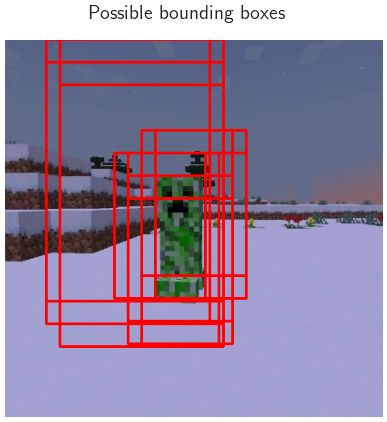

In [741]:
orig = utils.Image.open(DATA_IMAGES_YOLO / '03_creeper_06_snowy_0_07.jpg').data
img = orig.copy()
bboxes, probs = find_detections(img, BIN_CLF, downscale=1.8, win_size=(100, 160), step_size=(15, 25))
for (x_min, y_min, x_max, y_max) in bboxes[8:]:
    cv2.rectangle(img, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)

fig, ax = plt.subplots(figsize=(5, 5))
fig.suptitle('Possible bounding boxes', y=0.95)
utils.reset_axes(ax)
ax.imshow(img)

utils.savefig(DIST_PLOTS / 'after_sliding_window.png', fig)

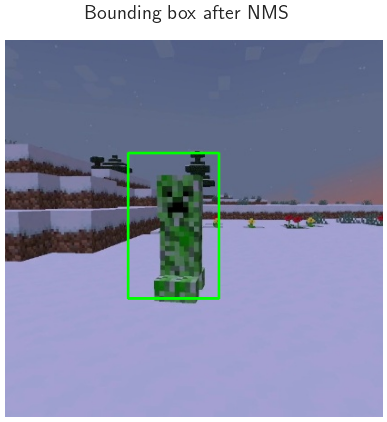

In [742]:
pick = non_max_suppression(bboxes, probs=probs, overlapThresh=0.4)
img = orig.copy()
cv2.rectangle(img, pick[0][:2], pick[0][2:], (0, 255, 0), 2)

fig, ax = plt.subplots(figsize=(5, 5))
fig.suptitle('Bounding box after NMS', y=0.95)
utils.reset_axes(ax)
ax.imshow(img)

utils.savefig(DIST_PLOTS / 'bbox_nms.png', fig)

# Собираем все вместе <a name="result"></a>

In [ ]:
def classification_pipeline(
        img: np.ndarray,
        bin_clf=BIN_CLF,
        multi_clf=MULTI_CLF,
        threshold: float = 0.7,
        downscale: float = 1.8,
        win_size: Tuple[int, int] = (100, 160),
        step_size: Tuple[int, int] = (15, 25),
        npick: int = 3,
) -> Tuple[int, np.ndarray, float]:
    bboxes, probs = find_detections(
        img,
        bin_clf,
        threshold=threshold,
        downscale=downscale,
        win_size=win_size,
        step_size=step_size
    )
    pick = non_max_suppression(bboxes, probs=probs, overlapThresh=0.4)
    return classify(img, pick[:npick], multi_clf)

time/image: 0.256581 s


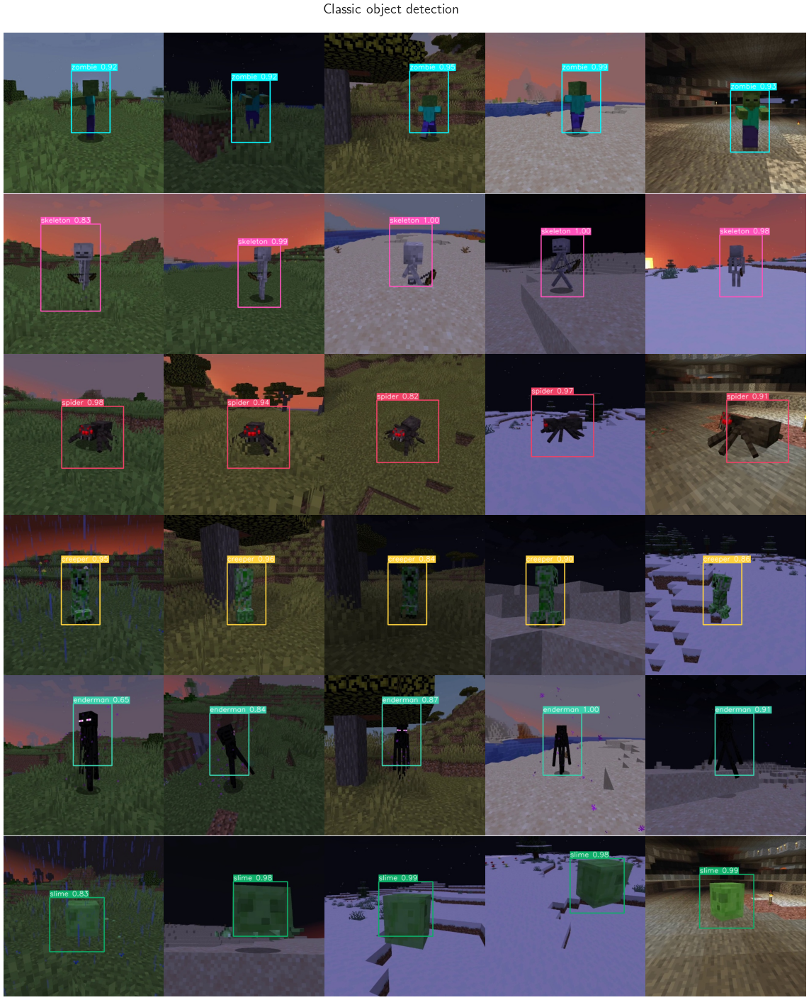

In [728]:
images = [
    # zombie
    '00_zombie_00_plains_0_00.jpg',
    '00_zombie_01_plains_1_41.jpg',
    '00_zombie_02_savanna_0_06.jpg',
    '00_zombie_04_desert_0_01.jpg',
    '00_zombie_08_cave_06.jpg',
    # skeleton
    '01_skeleton_00_plains_0_06.jpg',
    '01_skeleton_00_plains_0_17.jpg',
    '01_skeleton_04_desert_0_19.jpg',
    '01_skeleton_05_desert_1_62.jpg',
    '01_skeleton_06_snowy_0_23.jpg',
    # spider
    '02_spider_00_plains_0_16.jpg',
    '02_spider_02_savanna_0_02.jpg',
    '02_spider_02_savanna_0_07.jpg',
    '02_spider_07_snowy_1_31.jpg',
    '02_spider_08_cave_01.jpg',
    # creeper
    '03_creeper_00_plains_0_20.jpg',
    '03_creeper_02_savanna_0_07.jpg',
    '03_creeper_03_savanna_1_60.jpg',
    '03_creeper_05_desert_1_50.jpg',
    '03_creeper_07_snowy_1_23.jpg',
    # enderman
    '04_enderman_00_plains_0_07.jpg',
    '04_enderman_00_plains_0_22.jpg',
    '04_enderman_02_savanna_0_11.jpg',
    '04_enderman_04_desert_0_17.jpg',
    '04_enderman_05_desert_1_16.jpg',
    # slime
    '05_slime_00_plains_0_01.jpg',
    '05_slime_04_desert_0_35.jpg',
    '05_slime_07_snowy_1_44.jpg',
    '05_slime_07_snowy_1_69.jpg',
    '05_slime_08_cave_21.jpg',
]
_win_helpers = {
    'zombie': {
        'downscale': 1.8,
        'win_size': (100, 160),
        'step_size': (22, 25),
    },
    'skeleton': {
        'downscale': 1.4,
        'win_size': (110, 160),
        'step_size': (24, 27),
    },
    'spider': {
        'downscale': 1.8,
        'win_size': (160, 160),
        'step_size': (15, 15),
    },
    'creeper': {
        'downscale': 1.8,
        'win_size': (100, 160),
        'step_size': (15, 25),
    },
    'enderman': {
        'downscale': 1.8,
        'win_size': (100, 160),
        'step_size': (15, 25),
    },
    'slime': {
        'downscale': 2.1,
        'win_size': (140, 140),
        'step_size': (20, 20),
    },
}

results = []
start = timeit.default_timer()
for img_name in images:
    mob = img_name.split('_')[1]
    img = utils.Image.open(DATA_IMAGES_YOLO / img_name).data
    cls, bbox, prob = classification_pipeline(img, **_win_helpers.get(mob, {}))
    bbox = utils.BBox(*utils.xyxy2xywhn(bbox, *utils.get_wh(img)))
    results.append((img, cls, bbox, prob))

print(f'time/image: {(timeit.default_timer() - start) / len(images):.6f} s')

nrows, ncols = 6, 5
fig: Figure = plt.figure(figsize=(utils.rectsize(15, nrows, ncols)))
fig.suptitle('Classic object detection', y=0.903)

grid = ImageGrid(fig, 111, nrows_ncols=(nrows, ncols), axes_pad=(0, 0))
for ax, (img, cls, bbox, prob) in zip(grid, results):
    utils.reset_axes(ax)
    name = f'{MOBS[cls]} {prob:.2f}'
    img = utils.visualize_bbox(img, bbox, name, color=COLOR_PALETTE.get(MOBS[cls]))
    ax.imshow(img)

utils.savefig(DIST_PLOTS / 'full_classification.png', fig)

# Нейронные сети. Глубокое обучение <a name="neural-networks"></a>

## R-CNN <a name="r-cnn"></a>

In [ ]:
# colab 1

## YOLO <a name="yolo"></a>

In [ ]:
# colab 2